# Dataset Overview
This is a translated Chinese webnovel data scraped from NovelUpdates on October 2022. There are 11 columns detailing the novel and its performance:
- title           : Novel's title
- description     : Novel's summary/description in English
- genres          : List of genres associated with each novel
- tags            : List of tags used to describe each novel's content
- overall_rates   : Novel's rating ((number of stars * star votes)/total voters)
- \*\_star_votes  : Number of voters who rate each novel with * stars
- rec_list        : Other novels recommended by readers of each novel

# Main Goal
Performing exploratory data analysis to understand the data for further machine learning process while simultaneously drawing insights regarding most popular novels and their performance

# Main Questions
1. Which type of novels are the most popular? Which genres and tags?
2. How does each genre and tag performs? Which ones have the highest performance?
3. How does each genre and tag correlate to another?

# Dependencies and Import Data

In [1]:
# data manipulation
import sys
import numpy as np
# np.set_printoptions(threshold=sys.maxsize)             # uncomment if need full np arr repr
np.set_printoptions(threshold=1000)                      # uncomment if need truncated np arr repr
import pandas as pd
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)
pd.set_option('display.max_colwidth',None)

from scipy.stats import kurtosis
from statistics import stdev

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn-pastel')
pal = sns.color_palette()
import plotly.graph_objects as go

from PIL import Image
from wordcloud import WordCloud,STOPWORDS,ImageColorGenerator

import regex as re

import networkx as nx
from pyvis.network import Network

# web scraping
from bs4 import BeautifulSoup
import requests
import cloudscraper
import ast

import jupyter_capture_output                            # magic function to save outputs
%load_ext nb_black

Jupyter Capture Output v0.0.8


<IPython.core.display.Javascript object>

In [2]:
df = pd.read_csv("NU_20221023.csv",sep=";;",engine="python")
df.head()

,title,description,genres,tags,overall_rates,5_star_votes,4_star_votes,3_star_votes,2_star_votes,1_star_votes,rec_list
0,MMORPG: The Elementalist,"A salaryman by day and an Aquamancer by night. Qin Ruo might be a newbie in the popular, immersive MMORPG, “Honor and Glory”. However, that did not stop him from using his wits and battle instincts to raise money for a beloved friend’s medical fees, which eventually led him to become an elite player in the game. As Qin Ruo and his comrades progress further into the game, the trials and tribulations they face magnify. Which faction will prevail on the Mythical Battlefield? Read to find out!","['Action', 'Adventure', 'Fantasy']","['Elemental Magic', 'Gamers', 'Male Protagonist', 'MMORPG', 'Modern Day', 'Underestimated Protagonist']",3.2,16,2,11,3,12,['Reign of the Hunters']
1,The True Scandal,"In order to coax his mentally sick sister to see the doctor, Xu Sheng sought out Tang Zhi and put forward a request for him to marry his sister. He even gave a condition that Tang Zhi could not refuse; he will help Tang Zhi’s mother with the case that sent her to jail. After Tang Zhi moved into their luxury house, he had to face a mentally sick fiancee plus a cold and arrogant brother-in-law. However, he could only bear with it for his mother’s sake. That is, until his fiancee got into a car accident.","['Psychological', 'Romance', 'Yaoi']","['Adapted to Drama CD', 'Adapted to Manhua', 'Boss-Subordinate Relationship', 'Businessmen', 'Child Abuse', 'Contracts', 'Misunderstandings', 'Modern Day', 'Mysterious Past', 'Past Trauma', 'Wealthy Characters']",3.9,16,2,2,2,4,[]
2,Wholeheartedly Willing,Lin Xi: I’ve lied to you a lot. Yu Xiucheng: As long as you’re happy.,"['Adult', 'Romance', 'Smut']","['Female Protagonist', 'Modern Day', 'Revenge']",3.6,14,1,4,2,6,[]
3,I Can View Character Attributes,"Xia Xu transmigrated to a parallel world and acquired the special ability to check everyone’s attributes. When he tried out his ability for the first time, he was almost blinded by the ridiculously good stats of an insignificant girl in his class. Name: Tang Youxin Lifeform Level: 1 Potential Destiny: Peerless Beauty (5 Stars), Fortune to Husband (5 Stars) … Hmm. It was said that love at first sight was mostly due to lust. However, Xia Xu swore that his love at first sight for Tang Youxin was solely due to her talents. Let’s just say that he had discovered her inner beauty. However, Xia Xu felt like something was off as he observed the happenings in this parallel world which seemed to be not much different than Earth. He lowered his head to look at his own status. Name: Xia Xu Lifeform Level: 1 Potential Destiny: [Side Character: «Hunter»] What? So it turned out that he was actually a side character?","['Action', 'Adventure', 'Martial', 'Arts', 'Sci-fi']","['Alternate World', 'Charismatic Protagonist', 'Cheats', 'Male Protagonist', 'Modern Day', 'Poor to Rich', 'Transmigration', 'Weak to Strong']",4.2,4,0,1,1,0,[]
4,Saving The Black Immortal Venerable,"Mu Yun Gui was the white moonlight of the male lead in a cultivation-based book. Mu Yun Gui herself didn’t know that she was a short-lived white moonlight, until one day, a junior sister who was the eldest lady from a prominent family came into her life and turned her life upside down. Her childhood sweetheart slowly got estranged from her and became close to the junior sister. In the end, he even abandoned her to save that junior sister. When Mu Yun Gui plunged into the deep sea, she saw a triumphant smile on the junior sister. At that time, she knew that the junior sister was a girl from a different world, and this world was a book. The cause of her cultivation stagnation was that the girl had robbed her luck. After the fall, Mu Yun Gui opened her eyes and found that she was not dead, but fell into an underground cave. In the cave, there was a ten-thousand-year-old ice block with a person inside it. Mu Yun Gi thought that this person also like her fell into

<IPython.core.display.Javascript object>

# Preprocessing
This process aims to make sure the data is complete, clean, valid so all the analysis and insights taken after this can be as accurate as possible

## Observe current state of data

**General Information**

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6487 entries, 0 to 6486
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   title          6487 non-null   object 
 1   description    6471 non-null   object 
 2   genres         6487 non-null   object 
 3   tags           6487 non-null   object 
 4   overall_rates  6487 non-null   float64
 5   5_star_votes   6487 non-null   int64  
 6   4_star_votes   6487 non-null   int64  
 7   3_star_votes   6487 non-null   int64  
 8   2_star_votes   6487 non-null   int64  
 9   1_star_votes   6487 non-null   int64  
 10  rec_list       6487 non-null   object 
dtypes: float64(1), int64(5), object(5)
memory usage: 557.6+ KB


<IPython.core.display.Javascript object>

From here, we can see how there must be missing values to be addressed in `description`. On the other hand, we have to see if there are data types issues especially with `genres`, `tags`, and `rec_list`

**Check for null value**

In [4]:
df.isna().sum()

title             0
description      16
genres            0
tags              0
overall_rates     0
5_star_votes      0
4_star_votes      0
3_star_votes      0
2_star_votes      0
1_star_votes      0
rec_list          0
dtype: int64

<IPython.core.display.Javascript object>

In [8]:
df[df['description'].isna()]

,title,description,genres,tags,overall_rates,5_star_votes,4_star_votes,3_star_votes,2_star_votes,1_star_votes,rec_list
2387,The Story of Two Male Mosquitoes,NaN,"['Drama', 'Romance', 'Shounen', 'Ai', 'Tragedy']","['Absent Parents', 'Insects', 'Non-humanoid Protagonist', 'Oneshot']",4.6,73,15,7,1,3,['Little Mushroom']
2468,A Letter to Home,NaN,['Horror'],"['Ghosts', 'Male Protagonist']",2.2,1,0,0,2,2,[]
2476,Seducing Brother-in-law Behind Sister’s Back,NaN,"['Adult', 'Smut', 'Yaoi']","['Adultery', 'Futanari']",3.1,11,5,10,4,10,"['Introduction to S*x Education', 'The Story of a Youth Being XXOO in Various Ways to Obtain Magic Power XD']"
2635,Story of a Foolish Virgin and a Doctor,NaN,"['Adult', 'Mature']","['Adultery', 'Doctors', 'First-time Interc**rse', 'Male Protagonist', 'Modern Day', 'Oneshot', 'R*pe']",3.5,27,10,14,9,9,[]
2876,Jade Tiger,NaN,"['Seinen', 'Wuxia']","['Adapted to Movie', 'Ancient China', 'Male Protagonist', 'Murders', 'Mystery Solving', 'Poisons', 'Revenge']",4.5,1,1,0,0,0,[]
3227,"That Day, I Was XX By a Strange Man in the Alley",NaN,"['Romance', 'Smut', 'Yaoi']","['Manipulative Characters', 'Multiple Personalities', 'Personality Changes', 'R*pe Victim Becomes Lover', 'R*pe', 'Short Story', 'Twisted Personality', 'Unrequited Love']",3.5,12,16,11,4,6,[]
3651,Little Monk,NaN,"['Adult', 'Mature', 'Smut', 'Yaoi']","['Ancient China', 'C*nnilingus', 'First-time Interc**rse', 'Futanari', 'Love Interest Falls in Love First', 'Mpreg', 'Naive Protagonist', 'Outdoor Interc**rse', 'Pregnancy', 'R*pe Victim Becomes Lover', 'Royalty', 'R*pe', 'Shy Characters']",3.6,13,5,9,4,3,[]
3853,Big and Little Sun Go Go,NaN,"['Action', 'Adventure', 'Comedy', 'Fantasy', 'Supernatural']","['Age Regression', 'Appearance Different from Actual Age', 'Butlers', 'Calm Protagonist', 'Cautious Protagonist', 'Child Protagonist', 'Cunning Protagonist', 'Determined Protagonist', 'Elemental Magic', 'Futuristic Setting', 'Game Elements', 'Handsome Male Lead', 'Healers', 'Heroes', 'Knights', 'Level System', 'Lucky Protagonist', 'Male Protagonist', 'Modern Knowledge', 'Multiple Protagonists', 'Parody', 'Post-apocalyptic', 'Shameless Protagonist', 'Special Abilities', 'Summoning Magic', 'System Administrator', 'Transported to Another World', 'Unlucky Protagonist', 'Vampires', 'World Hopping', 'Zombies']",4.2,11,3,3,1,1,"['The Legend of Sun Knight', 'Dominion’s End', 'Eclipse Hunter', 'Illusions, Lies, Truth', 'No Hero']"
4216,Online Game Lewd Fate,NaN,"['Adult', 'Ecchi', 'Mature']","['Game Elements', 'Gamers', 'Male Protagonist']",3.4,9,5,8,5,3,[]
4718,It Might Be a Hottie,NaN,"['Shounen', 'Ai', 'Supernatural', 'Tragedy']","['Adapted to Drama CD', 'Dead Protagonist', 'Death', 'Ghosts', 'Oneshot']",4.0,18,12,6,4,1,"['Gaze at the Scenes of Debauchery', 'The Decade of Deep Love']"


<IPython.core.display.Javascript object>

When we manually check the description for each of these 16 novels on NovelUpdates, we can see the values are all `N/A` which means this missing values are not because of an error in the process of getting the data. Normally, since there are so few of them compared to our total data points, we can just drop these novels. However, since there won't be any deep analysis or process involving the description, we can keep them and utilize the other variables.

**Check for duplicate titles**

In [20]:
# print df rows when the title is in the duplicated list
# this will return each instances of duplicated novels,
# not only the second one of which `.duplicated()` values would be False
df[df['title'].isin(df[df['title'].duplicated()]['title'].to_list())]

,title,description,genres,tags,overall_rates,5_star_votes,4_star_votes,3_star_votes,2_star_votes,1_star_votes,rec_list
1773,The Imperial Concubine Just Wants To Be a Salted Fish Every Day,"Xiao Xixi travelled back to ancient times and became one of the prince’s concubines. It should have been the beginning of the palace fight, but she just wanted to be a salted fish. Salted fish is the way to survive, and eating and waiting for death is the true meaning of life! But, Prince Gao Leng loves her very much …….. Father Xiao: Daughter, you have to live up to your expectations, our family can count on you to climb the heights of dragons and the phoenixes! Xiao Xixi: No, I’m just a salted fish Palace maid : Little Master, you have to live up to your expectations, you must defeat those green tea b*tches to become the crown princess! Xiao Xixi: No, I’m just a salted fish Crown Prince : Concubine Ai, you have to live up to your expectations, I just count on you to inherit the lineage! Xiao Xixi: No, I’m just a salted fish Prince : It’s okay, I can be a lazy bump too.","['Action', 'Comedy', 'Drama', 'Fantasy', 'Martial', 'Arts', 'Romance']","['Adapted to Manhua', 'Ancient China', 'Ancient Times', 'Fantasy Creatures', 'Fantasy World', 'Female Protagonist', 'Lazy Protagonist', 'Office Romance']",3.7,7,5,5,1,2,"['The Emperor Has An Illness', 'The Charming Villain Just Wants To Be A Salted Fish']"
4681,The Imperial Concubine Just Wants To Be a Salted Fish Every Day,"Xiao Xixi traveled back to ancient times and became one of the prince’s little wives. It should be the beginning of Gong Dou, but she just wanted to be a salted fish. Competing for favor? nonexistent! Salted fish is the way to survive, mixed eating and waiting for death is the essence of life! Can be biased, Prince Gao Leng loves her this one. Father Xiao: Girl, you have to stand up, our family can count on you to climb the dragon and attach the phoenix! Xiao Xixi: No, I’m just a salted fish. Lady of the palace: Little lord, you have to stand up, and you must defeat those green tea b*tches and become princesses! Xiao Xixi: No, I’m just a salted fish. Prince: Ai Concubine, you have to live up to it, Gu will count on you to pass on from generation to generation! Xiao Xixi: No, I’m just a salted fish. Prince: It doesn’t matter, I can also be a salted fish.","['Comedy', 'Fantasy', 'Josei', 'Mature', 'Romance']","['Adapted to Manhua', 'Ancient China', 'Early Romance', 'Female Protagonist', 'Imperial Harem', 'Lazy Protagonist', 'Love Interest Falls in Love First', 'Male Protagonist', 'Marriage', 'Pregnancy', 'Royalty', 'Schemes And Conspiracies', 'Siblings Not Related by Blood', 'Strong Love Interests', 'Transmigration', 'Twins', 'Yandere']",4.5,22,3,3,1,1,"['The Charming Villain Just Wants To Be A Salted Fish', 'I’m A Cool Salted Fish In The Entertainment Industry', 'Your Humble Servant is Guilty!', 'Pampered Consort’s Acting Awards', 'A Precious Pearl in the Imperial City', 'The Royal’s Little Lady']"


<IPython.core.display.Javascript object>

Based on their respective Series pages in NovelUpdates, it seems like they are different translation works of the same **Chinese webnovel** by different people. Therefore they can be considered to be actual duplicates and need to be addressed.

**Check for appropriate data types**

In [22]:
print(df['genres'].unique())
print(type(df['genres'][0]))

["['Action', 'Adventure', 'Fantasy']"
 "['Psychological', 'Romance', 'Yaoi']" "['Adult', 'Romance', 'Smut']"
 "['Action', 'Adventure', 'Martial', 'Arts', 'Sci-fi']"
 "['Comedy', 'Martial', 'Arts', 'Romance', 'Supernatural', 'Xianxia']"
 "['Adventure', 'Comedy', 'Drama', 'Gender', 'Bender', 'Josei', 'Psychological', 'Romance', 'Xianxia']"
 "['Action', 'Adventure', 'Drama', 'Fantasy', 'Sci-fi', 'Supernatural', 'Tragedy', 'Xuanhuan']"
 "['Action', 'Adult', 'Harem', 'Martial', 'Arts', 'Supernatural']"
 "['Action', 'Adventure', 'Comedy', 'Romance', 'Sci-fi', 'Shounen', 'Ai']"
 "['Action', 'Adventure', 'Romance', 'Wuxia']"
 "['Adventure', 'Drama', 'Fantasy', 'Romance', 'Shoujo', 'Slice', 'of', 'Life']"
 "['Action', 'Adventure', 'Harem', 'Martial', 'Arts', 'Mystery', 'Xianxia']"
 "['Historical', 'Romance', 'Slice', 'of', 'Life']"
 "['Drama', 'Romance', 'Slice', 'of', 'Life']"
 "['Drama', 'Romance', 'School', 'Life', 'Shounen', 'Ai', 'Slice', 'of', 'Life']"
 "['Action', 'Adventure', 'Fantasy',

<IPython.core.display.Javascript object>

In [28]:
print(df['tags'].unique())
print(type(df['tags'][0]))

["['Elemental Magic', 'Gamers', 'Male Protagonist', 'MMORPG', 'Modern Day', 'Underestimated Protagonist']"
 "['Adapted to Drama CD', 'Adapted to Manhua', 'Boss-Subordinate Relationship', 'Businessmen', 'Child Abuse', 'Contracts', 'Misunderstandings', 'Modern Day', 'Mysterious Past', 'Past Trauma', 'Wealthy Characters']"
 "['Female Protagonist', 'Modern Day', 'Revenge']" ...
 "['Acting', 'Beautiful Female Lead', 'Celebrities', 'Collection of Short Stories', 'Comedic Undertone', 'Demons', 'Female Protagonist', 'Handsome Male Lead', 'Heartwarming', 'Love Interest Falls in Love First', 'Male Yandere', 'Modern Day', 'Multiple Realms', 'Vampires', 'Yandere']"
 "['Beautiful Female Lead', 'Female Protagonist', 'Handsome Male Lead', 'Transmigration', 'World Hopping']"
 "['Abusive Characters', 'Boss-Subordinate Relationship', 'Business Management', 'Complex Family Relationships', 'Female Protagonist', 'Handsome Male Lead', 'Modern Day', 'R*pe Victim Becomes Lover', 'R*pe', 'S*xual Abuse', 'Tsund

<IPython.core.display.Javascript object>

In [29]:
print(df['rec_list'].unique())
print(type(df['rec_list'][0]))

["['Reign of the Hunters']" '[]'
 "['The Charming Villain Just Wants To Be A Salted Fish', 'Offering Salted Fish To Master', 'Lady Cultivator']"
 ...
 "['The Girl Who Cured the Crazy BOSS is Majestic and Mighty', 'Let the Villain Go', 'Everyone But Me is Reborn', 'The Charming Villain Just Wants To Be A Salted Fish']"
 "['I Want to Be Friends With You', 'Devil’s Warmth', 'Absolute Redemption [Book Transmigration]', 'Guide to Stabilizing the Blackening of the Villainous Husband', 'I Married the Male Lead of a CP-free Novel']"
 "['The Star Light Shines When He Came', 'Quick Transmigration with Female Lead Aura', 'Quick Transmigration: Heroine Arrives, Woman Rapidly Retreats!', 'Quick Transmigration: Male Lead, You’re Overpowered?', 'Side Character Transmigrations: The Final Boss is No Joke', 'Unruly Phoenix Xiaoyao']"]
<class 'str'>


<IPython.core.display.Javascript object>

Here we can see how the columns tested above are stored as strings instead of array, so we need to transform these columns.
<br>
While checking the data types, we also discovered how the genres need to be fixed since it doesn't suit NovelUpdate's [official genres list](https://www.novelupdates.com/genre-explanation/). This most likely happen during the web scraping process which causes the genres with more than one words to be separated (eg. 'Shounen Ai' becomes 'Shounen' and 'Ai')

## Summary of problems needed to be addressed in preprocessing:
* Perform imputation on missing values in `description`
* Eliminate duplicates
* Change the data types for genres, tags, and rec_list
* Fix the genres

## 1. Fill missing values on `description`
Since description is a unique data and imputation can't be performed using one of the central tendency, this process is done by filling nulls with 'No Description' instead

In [3]:
df['description'] = df['description'].fillna('No Description')
df['description'].isna().sum()

0

<IPython.core.display.Javascript object>

## 2. Drop the duplicates, keep first
This data was scraped using the search URL sorted by update in descending order, so newer -> more maintained

In [4]:
df = df.drop_duplicates(subset='title',keep='first')
df['title'].duplicated().value_counts()

False    6486
Name: title, dtype: int64

<IPython.core.display.Javascript object>

## 3. Change data types

In [5]:
def change_types(ser):
    ser = ser.apply(lambda x: x.replace("',",":::").replace(" '","").replace("['","").replace("']","").replace("[]","").split(":::"))
    return ser

arr_var = ['genres','tags','rec_list']
for var in arr_var:
    df[var] = change_types(df[var])
df.head()

,title,description,genres,tags,overall_rates,5_star_votes,4_star_votes,3_star_votes,2_star_votes,1_star_votes,rec_list
0,MMORPG: The Elementalist,"A salaryman by day and an Aquamancer by night. Qin Ruo might be a newbie in the popular, immersive MMORPG, “Honor and Glory”. However, that did not stop him from using his wits and battle instincts to raise money for a beloved friend’s medical fees, which eventually led him to become an elite player in the game. As Qin Ruo and his comrades progress further into the game, the trials and tribulations they face magnify. Which faction will prevail on the Mythical Battlefield? Read to find out!","[Action, Adventure, Fantasy]","[Elemental Magic, Gamers, Male Protagonist, MMORPG, Modern Day, Underestimated Protagonist]",3.2,16,2,11,3,12,[Reign of the Hunters]
1,The True Scandal,"In order to coax his mentally sick sister to see the doctor, Xu Sheng sought out Tang Zhi and put forward a request for him to marry his sister. He even gave a condition that Tang Zhi could not refuse; he will help Tang Zhi’s mother with the case that sent her to jail. After Tang Zhi moved into their luxury house, he had to face a mentally sick fiancee plus a cold and arrogant brother-in-law. However, he could only bear with it for his mother’s sake. That is, until his fiancee got into a car accident.","[Psychological, Romance, Yaoi]","[Adapted to Drama CD, Adapted to Manhua, Boss-Subordinate Relationship, Businessmen, Child Abuse, Contracts, Misunderstandings, Modern Day, Mysterious Past, Past Trauma, Wealthy Characters]",3.9,16,2,2,2,4,[]
2,Wholeheartedly Willing,Lin Xi: I’ve lied to you a lot. Yu Xiucheng: As long as you’re happy.,"[Adult, Romance, Smut]","[Female Protagonist, Modern Day, Revenge]",3.6,14,1,4,2,6,[]
3,I Can View Character Attributes,"Xia Xu transmigrated to a parallel world and acquired the special ability to check everyone’s attributes. When he tried out his ability for the first time, he was almost blinded by the ridiculously good stats of an insignificant girl in his class. Name: Tang Youxin Lifeform Level: 1 Potential Destiny: Peerless Beauty (5 Stars), Fortune to Husband (5 Stars) … Hmm. It was said that love at first sight was mostly due to lust. However, Xia Xu swore that his love at first sight for Tang Youxin was solely due to her talents. Let’s just say that he had discovered her inner beauty. However, Xia Xu felt like something was off as he observed the happenings in this parallel world which seemed to be not much different than Earth. He lowered his head to look at his own status. Name: Xia Xu Lifeform Level: 1 Potential Destiny: [Side Character: «Hunter»] What? So it turned out that he was actually a side character?","[Action, Adventure, Martial, Arts, Sci-fi]","[Alternate World, Charismatic Protagonist, Cheats, Male Protagonist, Modern Day, Poor to Rich, Transmigration, Weak to Strong]",4.2,4,0,1,1,0,[]
4,Saving The Black Immortal Venerable,"Mu Yun Gui was the white moonlight of the male lead in a cultivation-based book. Mu Yun Gui herself didn’t know that she was a short-lived white moonlight, until one day, a junior sister who was the eldest lady from a prominent family came into her life and turned her life upside down. Her childhood sweetheart slowly got estranged from her and became close to the junior sister. In the end, he even abandoned her to save that junior sister. When Mu Yun Gui plunged into the deep sea, she saw a triumphant smile on the junior sister. At that time, she knew that the junior sister was a girl from a different world, and this world was a book. The cause of her cultivation stagnation was that the girl had robbed her luck. After the fall, Mu Yun Gui opened her eyes and found that she was not dead, but fell into an underground cave. In the cave, there was a ten-thousand-year-old ice block with a person inside it. Mu Yun Gi thought that this person also like her fell into the forbidden area, and out of good intentions, she unlocked the seal. Jiang Shao Cai

<IPython.core.display.Javascript object>

## 4. Correct the genres
It seems like the genres with more than one word are split by space, so we have to make sure the genres are valid, ie. included in the official list of novel genres by NovelUpdates

### Get the list of genres by simple web scraping

In [6]:
url_genre = 'https://www.novelupdates.com/genre-explanation/'
df_genre = pd.DataFrame()
with requests.Session() as sess:
    headers = {
        'User-Agent':"Mozilla/5.0 (Windows NT 5.1; rv:7.0.1) Gecko/20100101 Firefox/7.0.1",
        'Accept':'text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,*/*;q=0.8'
    }
    cfs = cloudscraper.create_scraper(sess=sess)
    page = cfs.get(url_genre,headers=headers)
soup = BeautifulSoup(page.text,'html.parser')
row = soup.find_all('tr')
for r in row:
    if (r.find('td')):
        dict_temp = {
            'genre':r.find_all('td')[0].text.rstrip(),
            'description':r.find_all('td')[1].text.rstrip()
        }
        df_genre = pd.concat([df_genre,pd.DataFrame.from_dict(dict_temp,orient='index').T]).reset_index(drop=True)
    else:
        continue
df_genre.to_csv('NU_Genre.csv',index=False)

<IPython.core.display.Javascript object>

### Correct the genre

**Read the CSV file**

In [6]:
df_genre = pd.read_csv('NU_Genre.csv')
df_genre['description'] = df_genre['description'].apply(lambda x: x.replace('\n',' '))
df_genre

,genre,description
0,Action,"A work typically depicting fighting, violence, chaos, and fast paced motion."
1,Adult,Contains mature content that is suitable only for adults. Titles in this category may include prolonged scenes of intense violence and/or graphic sexual content and nudity.
2,Adventure,"Exploring new places, environments or situations. This is often associated with people on long journeys to places far away encountering amazing things."
3,Comedy,A dramatic work that is light and often humorous or satirical in tone and that usually contains a happy resolution of the thematic conflict.
4,Drama,"A work meant to bring on an emotional response, such as instilling sadness or tension. Novels that often show life or characters through conflict and emotions. In general, the different parts of the story tend to form a whole that is greater than the sum of the parts. In other words, the story has a message that is bigger than just the story line itself"
5,Ecchi,"Possibly the line between hentai and non-hentai, ecchi usually refers to fanservice put in to attract a certain group of fans."
6,Fantasy,"Anything that involves, but not limited to, magic, dream world, and fairy tales."
7,Gender Bender,"Girls dressing up as guys, guys dressing up as girls. Guys turning into girls, girls turning into guys."
8,Harem,A series involving one male character and many female characters (usually attracted to the male character). A Reverse Harem is when the genders are reversed.
9,Historical,"Novels whose setting is in the past. Frequently these follow historical tales, sagas or facts. World with kingdom setting that are not from actual history saga, tales, are not included."


<IPython.core.display.Javascript object>

**Only select genres with words > 1 (the ones need to be fixed)**

In [7]:
df_genre_temp = df_genre.copy().drop(columns=['description'])
df_genre_temp['genre_split'] = df_genre['genre'].apply(lambda x: x.split(' '))
df_genre_temp = df_genre_temp.loc[df_genre_temp['genre_split'].str.len() > 1]
df_genre_temp

,genre,genre_split
7,Gender Bender,"[Gender, Bender]"
12,Martial Arts,"[Martial, Arts]"
18,School Life,"[School, Life]"
22,Shoujo Ai,"[Shoujo, Ai]"
24,Shounen Ai,"[Shounen, Ai]"
25,Slice of Life,"[Slice, of, Life]"


<IPython.core.display.Javascript object>

**Substitute all the wrongly split words with the correct string**

In [8]:
df_fix = df.copy()
# loop for every genres with more than 1 words
for gen_list, gen in zip(df_genre_temp['genre_split'],df_genre_temp['genre']):
    # create mask of all rows of which genres list include all words in gen_list
    mask = df_fix['genres'].apply(lambda x: set(gen_list)<=set(x))
    # if not in gen_list, then the element itself
    # otherwise it's gen
    # turn it into a set so no duplicates
    df_fix.loc[mask,'genres'] = df_fix.loc[mask,'genres'].apply(lambda check: [*set([el if el not in gen_list else gen for el in check])])
    # special case  for slice of life:
    if (gen=='Slice of Life'):
        gen_list2 = ['Slice','of']
        mask2 = df_fix['genres'].apply(lambda x: set(gen_list2)<=set(x))
        df_fix.loc[mask2,'genres'] = df_fix.loc[mask2,'genres'].apply(lambda check: [*set([el if el not in gen_list2 else gen for el in check])])
df_fix.tail()

,title,description,genres,tags,overall_rates,5_star_votes,4_star_votes,3_star_votes,2_star_votes,1_star_votes,rec_list
6482,"Sweetheart, I’ll Spoil You","Female college student Xia Yiduo, on a graduation trip, met a series of strange events that happened. After that, she always had that same dream she didn’t want to remember. Until three months later, while holding an ultrasound report …","[Romance, Supernatural]","[Brother Complex, Doting Love Interests, Dreams, Early Romance, Female Protagonist, Ghosts, Mystery Solving, Pregnancy, R*pe, Sister Complex]",2.8,10,6,2,2,15,[Sweet Husband Pampers His Wife]
6483,Heimarian Odyssey,"Locke is a middling officer in the Kingdom of Faustian’s army. He happens to be at the wrong place at the wrong time, or the right place at the right time, depending on your perspective, and happens to save the kingdom’s princess. As fortune would have it, love prospers, but in a world of peasantry and nobility, a middling, peasant-born soldier has no right to love a princess. Locke is nothing if not determined, however, and sets out to become someone worthy of loving the princess, someone her family can accept. But that path is neither short, nor safe, as our hero will soon discover.","[Mature, Martial Arts, Xuanhuan, Adventure, Harem, Action]","[Adopted Children, Adventurers, Antihero Protagonist, Aristocracy, Army, Average-looking Protagonist, Beast Companions, Brotherhood, Calm Protagonist, Charismatic Protagonist, Cosmic Wars, Cousins, Cruel Characters, Cultivation, Demi-Humans, Depictions of Cruelty, Doting Love Interests, Doting Older Siblings, Early Romance, Empires, Family, Fanfiction, Fantasy Creatures, Fantasy World, Generals, Guilds, Incest, Kingdom Building, Knights, Loyal Subordinates, Magic, Maids, Male Protagonist, Master-Disciple Relationship, Master-Servant Relationship, Mature Protagonist, Medieval, Military, Monsters, Multiple POV, Nationalism, Nobles, Older Love Interests, Politics, Polygamy, Pragmatic Protagonist, Pregnancy, Romantic Subplot, Royalty, R*pe, Ruthless Protagonist, S*x S*aves, S*aves, Strength-based Social Hierarchy, Strong to Stronger, Wars, Wizards]",2.8,22,3,7,7,27,[Trash of the Count’s Family]
6484,The Lover’s Prattle,"How pitiful is a life without love? In every happy ending, there is always a male character who either meets his demise or spends the rest of his life alone. Maybe he regards feelings as playthings, or maybe he doesn’t care. When the whole world turns its back on him, will there be someone… someone who turns their back on the world, to take his hand? I love you. Your dreams, Your strengths, and your flaws. These are the stories of said male characters and their special someones.","[Adventure, Fantasy, Josei, Romance, Supernatural]","[Acting, Beautiful Female Lead, Celebrities, Collection of Short Stories, Comedic Undertone, Demons, Female Protagonist, Handsome Male Lead, Heartwarming, Love Interest Falls in Love First, Male Yandere, Modern Day, Multiple Realms, Vampires, Yandere]",4.1,62,8,10,7,9,"[The Star Light Shines When He Came, Quick Transmigration with Female Lead Aura, Quick Transmigration: Heroine Arrives, Woman Rapidly Retreats!, Quick Transmigration: Male Lead, You’re Overpowered?, Side Character Transmigrations: The Final Boss is No Joke, Unruly Phoenix Xiaoyao]"
6485,Male God Please Lie Down,"For revenge, she sold her soul to a powerful man. In order to have her revenge, start to transmigrate to different worlds! There are many wonderful worlds, meet with so many best character, Green Tea Bissh, White Lotus, Mary Sue, and even Scumbag man!! Of course, there are also many high quality of Male Gods! Cannon fodder counterattack, invicible male god please… lie down!","[Adventure, Fantasy, Romance]","[Beautiful Female Lead, Female Protagonist, Handsome Male Lead, Transmigration, World Hopping]",3.1,7,3,2,3,6,"[Quick Transmigration: Report to the Host, You Have Been Attacked!]"
6486,WARNING! Tsundere President,"She was the little chief secreta

<IPython.core.display.Javascript object>

In [9]:
df_fix[df_fix['genres'].apply(lambda x: set(['Slice of Life'])<=set(x))==True]

,title,description,genres,tags,overall_rates,5_star_votes,4_star_votes,3_star_votes,2_star_votes,1_star_votes,rec_list
10,The Resplendent Farming Apothecary,"The genius pharmacist transmigrated into a pitiful farm girl’s body. Ignored by her own father, abused by her stepmother, and bullied by her stepbrothers. Her “twin” brother was given to distant relative and she went as the “extra” to live under someone else’s roof. Luckily, she possessed incredible apothecary skills. Collecting herbs, plowing herb fields, formulating medicines and treating the ills, she refused to live an ordinary life as she slowly uncovered the truth of her real identify. Inadvertently, she saved a dashing man who was in reality a big, bad wolf hiding under the skin of an innocent little puppy. He pulled out all his tricks: I have no other means to return your favor of saving my life. How about I repay you by marrying you?","[Romance, Shoujo, Slice of Life, Adventure, Fantasy, Drama]","[Alchemy, Ancient Times, Calm Protagonist, Carefree Protagonist, Clever Protagonist, Cold Love Interests, Complex Family Relationships, Confident Protagonist, Cooking, Cunning Protagonist, Cute Protagonist, Devoted Love Interests, Doting Love Interests, Doting Older Siblings, Family, Farming, Female Protagonist, Genius Protagonist, Handsome Male Lead, Love Interest Falls in Love First, Magical Space, Multiple Transported Individuals, Mysterious Family Background, Older Love Interests, Persistent Love Interests, Pill Concocting, Playful Protagonist, Poor Protagonist, Poor to Rich, Previous Life Talent, Strong Love Interests, Transmigration, Transported to Another World, Weak to Strong, Younger Sisters]",4.3,86,26,17,8,5,"[Godly Farmer Doctor: Arrogant Husband, Can’t Afford to Offend!, Fields of Gold, Transmigration with QQ Farm, Assassin Farmer, Picking Up a General to Plow the Fields, Pampered Consort of the Fragrant Orchard]"
12,"That Village, That Person, That Fool","In a faraway village, the Lee family’s eldest daughter, Hehua marries the village fool Changsheng… A lighthearted story about a simple village fool and the winsome village girl.","[Romance, Historical, Slice of Life]","[Family, Marriage, Pregnancy, Slow Romance, Social Outcasts]",3.7,2,4,3,1,0,"[Beautiful Farming Wife, My Husband With Scholar Syndrome]"
13,My Wife Is Dominant,"Wang Weixi, a boy from a mountain village, had a cyber-date with Chen Kexin, a girl from a wealthy family. After a one-night stand, they tied the knot. He thought he married a pretty and lovely wife, so he did not expect that he had to do all the domestic chores. He was a good husband who never complained about anything, but she was a gorgeous, lazy wife. Would she change for him? Would he love her forever? As the bridegroom’s best friend, Yi Duanfang thought the newlyweds would get divorced, so did the bride’s sister Chen Keren. There would be a wonderful encounter between the effeminate man and the mature-looking girl. What would they do to destroy the newlyweds’ marriage? Would they succeed in carrying out their plot?","[Romance, Drama, Slice of Life]",[Modern Day],3.1,12,3,6,3,11,[]
14,Through The Strait Gates,"“Because strait is the gate, and narrow is the way, which leadeth unto life, and few there be that find it.” -Matthew 7:14 Guomen, 過門/过门, meaning marriage in Chinese. If explained literally, it means going past the gates/door-a reference to the Bible(see above). “Through the Strait Gates”: to me, it’s the best way to explain it. The gate’s narrow, the road small for them. Their past and future interwoven into a tangled, messed up web. Thirteen years of sour and bittersweet memories. And seven years in between that washed out everything they had like water, leaving only stark, plain, throbbing dullness.","[Romance, Slice of Life, School Life, Shounen Ai, Drama]","[Adapted to Drama CD, Age Progression, Coming of Age, Couple Growth, Death, Death of Loved Ones, Handsome Male Lead, Hard-Working Protagonist, Love Interest Falls 

<IPython.core.display.Javascript object>

Special case about **'Slice of Life'**:<br>
Since the code will replace all the split words with the 'correct' string and 'School Life' genre is 'fixed' before 'Slice of Life', the word 'Life' in novels with both genres will already be used and only left with 'School' and 'of'. To make sure that they also get converted to 'Slice of Life' despite missing 'Life', we performed a second 'fix-it' scenario where the list of words we're looking for are just 'Slice' and 'of'

## Final dataframe after pre-processing

In [9]:
df = df_fix.copy()
df.head()

,title,description,genres,tags,overall_rates,5_star_votes,4_star_votes,3_star_votes,2_star_votes,1_star_votes,rec_list
0,MMORPG: The Elementalist,"A salaryman by day and an Aquamancer by night. Qin Ruo might be a newbie in the popular, immersive MMORPG, “Honor and Glory”. However, that did not stop him from using his wits and battle instincts to raise money for a beloved friend’s medical fees, which eventually led him to become an elite player in the game. As Qin Ruo and his comrades progress further into the game, the trials and tribulations they face magnify. Which faction will prevail on the Mythical Battlefield? Read to find out!","[Action, Adventure, Fantasy]","[Elemental Magic, Gamers, Male Protagonist, MMORPG, Modern Day, Underestimated Protagonist]",3.2,16,2,11,3,12,[Reign of the Hunters]
1,The True Scandal,"In order to coax his mentally sick sister to see the doctor, Xu Sheng sought out Tang Zhi and put forward a request for him to marry his sister. He even gave a condition that Tang Zhi could not refuse; he will help Tang Zhi’s mother with the case that sent her to jail. After Tang Zhi moved into their luxury house, he had to face a mentally sick fiancee plus a cold and arrogant brother-in-law. However, he could only bear with it for his mother’s sake. That is, until his fiancee got into a car accident.","[Psychological, Romance, Yaoi]","[Adapted to Drama CD, Adapted to Manhua, Boss-Subordinate Relationship, Businessmen, Child Abuse, Contracts, Misunderstandings, Modern Day, Mysterious Past, Past Trauma, Wealthy Characters]",3.9,16,2,2,2,4,[]
2,Wholeheartedly Willing,Lin Xi: I’ve lied to you a lot. Yu Xiucheng: As long as you’re happy.,"[Adult, Romance, Smut]","[Female Protagonist, Modern Day, Revenge]",3.6,14,1,4,2,6,[]
3,I Can View Character Attributes,"Xia Xu transmigrated to a parallel world and acquired the special ability to check everyone’s attributes. When he tried out his ability for the first time, he was almost blinded by the ridiculously good stats of an insignificant girl in his class. Name: Tang Youxin Lifeform Level: 1 Potential Destiny: Peerless Beauty (5 Stars), Fortune to Husband (5 Stars) … Hmm. It was said that love at first sight was mostly due to lust. However, Xia Xu swore that his love at first sight for Tang Youxin was solely due to her talents. Let’s just say that he had discovered her inner beauty. However, Xia Xu felt like something was off as he observed the happenings in this parallel world which seemed to be not much different than Earth. He lowered his head to look at his own status. Name: Xia Xu Lifeform Level: 1 Potential Destiny: [Side Character: «Hunter»] What? So it turned out that he was actually a side character?","[Sci-fi, Adventure, Martial Arts, Action]","[Alternate World, Charismatic Protagonist, Cheats, Male Protagonist, Modern Day, Poor to Rich, Transmigration, Weak to Strong]",4.2,4,0,1,1,0,[]
4,Saving The Black Immortal Venerable,"Mu Yun Gui was the white moonlight of the male lead in a cultivation-based book. Mu Yun Gui herself didn’t know that she was a short-lived white moonlight, until one day, a junior sister who was the eldest lady from a prominent family came into her life and turned her life upside down. Her childhood sweetheart slowly got estranged from her and became close to the junior sister. In the end, he even abandoned her to save that junior sister. When Mu Yun Gui plunged into the deep sea, she saw a triumphant smile on the junior sister. At that time, she knew that the junior sister was a girl from a different world, and this world was a book. The cause of her cultivation stagnation was that the girl had robbed her luck. After the fall, Mu Yun Gui opened her eyes and found that she was not dead, but fell into an underground cave. In the cave, there was a ten-thousand-year-old ice block with a person inside it. Mu Yun Gi thought that this person also like her fell into the forbidden area, and out of good intentions, she unlocked the seal. Jiang Shao Cai 

<IPython.core.display.Javascript object>

# Total voters distribution

## `total_voters`
New column which is the sum of all star votes

In [11]:
df_voters = df.copy()
df_voters['total_voters'] = df_voters.apply(lambda row: row['5_star_votes']+row['4_star_votes']+row['3_star_votes']+row['2_star_votes']+row['1_star_votes'],axis=1)
df_voters.head(2)

,title,description,genres,tags,overall_rates,5_star_votes,4_star_votes,3_star_votes,2_star_votes,1_star_votes,rec_list,total_voters
0,MMORPG: The Elementalist,"A salaryman by day and an Aquamancer by night. Qin Ruo might be a newbie in the popular, immersive MMORPG, “Honor and Glory”. However, that did not stop him from using his wits and battle instincts to raise money for a beloved friend’s medical fees, which eventually led him to become an elite player in the game. As Qin Ruo and his comrades progress further into the game, the trials and tribulations they face magnify. Which faction will prevail on the Mythical Battlefield? Read to find out!","[Action, Adventure, Fantasy]","[Elemental Magic, Gamers, Male Protagonist, MMORPG, Modern Day, Underestimated Protagonist]",3.2,16,2,11,3,12,[Reign of the Hunters],44
1,The True Scandal,"In order to coax his mentally sick sister to see the doctor, Xu Sheng sought out Tang Zhi and put forward a request for him to marry his sister. He even gave a condition that Tang Zhi could not refuse; he will help Tang Zhi’s mother with the case that sent her to jail. After Tang Zhi moved into their luxury house, he had to face a mentally sick fiancee plus a cold and arrogant brother-in-law. However, he could only bear with it for his mother’s sake. That is, until his fiancee got into a car accident.","[Psychological, Romance, Yaoi]","[Adapted to Drama CD, Adapted to Manhua, Boss-Subordinate Relationship, Businessmen, Child Abuse, Contracts, Misunderstandings, Modern Day, Mysterious Past, Past Trauma, Wealthy Characters]",3.9,16,2,2,2,4,[],26


<IPython.core.display.Javascript object>

## `total_voters` statistics summary

In [14]:
df_voters['total_voters'].describe()

count    6486.000000
mean      108.747148
std       209.740783
min         0.000000
25%        18.000000
50%        43.000000
75%       111.000000
max      3562.000000
Name: total_voters, dtype: float64

<IPython.core.display.Javascript object>

In [20]:
df_voters['total_voters'].mode()

0    12
Name: total_voters, dtype: int64

<IPython.core.display.Javascript object>

We can see that the mean is quite high, but there's a big gap between Q3 and maximum values, indicating quite long tail to the right of the distribution. The standard deviation is also very high with almost ~210 votes. <br>
From this data, we can conclude how some novels are really really popular but most translated webnovels are quite niche (with the mode being 12 and the median 43).

## `total_voters` distribution

<AxesSubplot:ylabel='Frequency'>

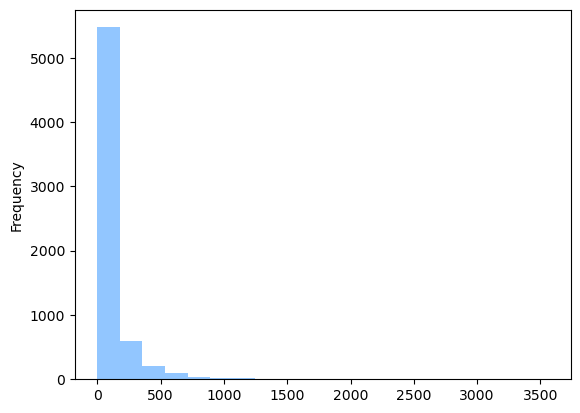

<IPython.core.display.Javascript object>

In [12]:
df_voters['total_voters'].plot(kind='hist',bins=20)

This confirms our suspicion based on the standard deviation and range on how skewed and spread out the distribution is. All measures of central tendency are also very far apart because of the outliers.<br>
If we ignore the extreme values and zoom in towards the center, we can see a clearer, extremely right skewed distribution.

<AxesSubplot:ylabel='Frequency'>

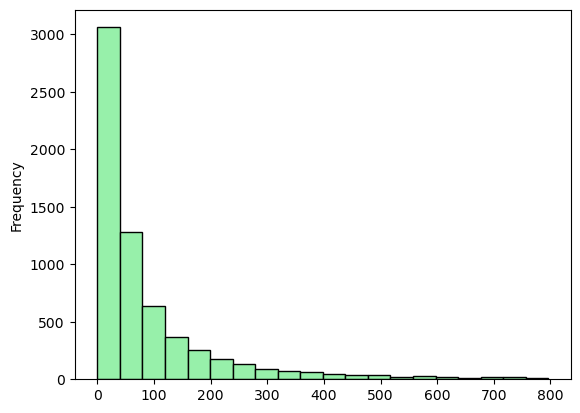

<IPython.core.display.Javascript object>

In [22]:
df_voters[df_voters['total_voters']<800]['total_voters'].plot(kind='hist',edgecolor='black',bins=20,color=pal[1])

## Highest `total_voters`
So which novel has the highest `total_voters`? How is its performance? Does it fit the mold of most popular, high-performing novels in the site or is it not?

In [21]:
df_voters[df_voters['total_voters']==max(df_voters['total_voters'])]

,title,description,genres,tags,overall_rates,5_star_votes,4_star_votes,3_star_votes,2_star_votes,1_star_votes,rec_list,total_voters
5006,Against the Gods,"Mythical Abode Mountain, Cloud’s End Cliff, the most dangerous of Azure Cloud Continent’s four deadly areas. Cloud’s End Cliff’s base is known as the Grim Reaper’s Cemetery. Over countless years, the number of people that have fallen off this cliff is too high to count. None of them, even three stronger than god masters, whose power could pierce the heavens, have been able to return alive. However, a boy that’s being chased by various people because he alone holds a priceless treasure jumps off the cliff, but instead of dying he wakes up in the body of a boy with the same name in another world! This is the story of a boy wielding the Sky Poison Pearl, cultivating the strength to oppose heaven and earth, a lord overlooking the world!","[Action, Ecchi, Fantasy, Adventure, Mature, Martial Arts, Harem, Xuanhuan]","[Adapted to Manhua, Arranged Marriage, Arrogant Characters, Artifacts, Beautiful Female Lead, Bloodlines, Body Tempering, Cultivation, Death of Loved Ones, Demons, Devoted Love Interests, Dragons, Enemies Become Lovers, Fast Cultivation, First-time Interc**rse, Handsome Male Lead, Heavenly Tribulation, Loli, Long Separations, Male Protagonist, Marriage, Master-Disciple Relationship, Medical Knowledge, Phoenixes, Polygamy, Pregnancy, Resurrection, Revenge, Romantic Subplot, Ruthless Protagonist, Sentient Objects, Shameless Protagonist, Sharp-tongued Characters, Soul Power, Spirits, Strong Love Interests, Student-Teacher Relationship, Threesome, Time Travel, Weak to Strong]",3.9,1996,440,351,239,536,"[Martial God Asura, Martial World, Chaotic Sword God, Tales of Demons and Gods, True Martial World, Emperor’s Domination]",3562


<IPython.core.display.Javascript object>

Apparently it's a novel called **Against The God**, a ['stallion novel'](https://www.reddit.com/r/SVSSS/comments/rcwhcb/what_does_a_stallion_novel_mean/) where the male protagonist seeks to conquer the world and the women within it. Very interesting! I genuinely thought it would be something like The Founder of Diabolism (Grandmaster of Demonic Cultivation or Mo Dao Zu Shi) since it was quite popular around the world and definitely has a lot of audience!

# Rating Distribution For All Novels

## `overall_rates` statistics summary

In [24]:
df_voters['overall_rates'].describe()

count    6486.000000
mean        3.755396
std         0.604313
min         0.000000
25%         3.400000
50%         3.900000
75%         4.200000
max         5.000000
Name: overall_rates, dtype: float64

<IPython.core.display.Javascript object>

In [25]:
df_voters['overall_rates'].mode()

0    4.0
Name: overall_rates, dtype: float64

<IPython.core.display.Javascript object>

The distribution is going to be more spread out but would not have a very long tail with 0.6 standard deviation, 3.76 average, and 4 mode. 

## `overall_rates` distribution

<AxesSubplot:ylabel='Frequency'>

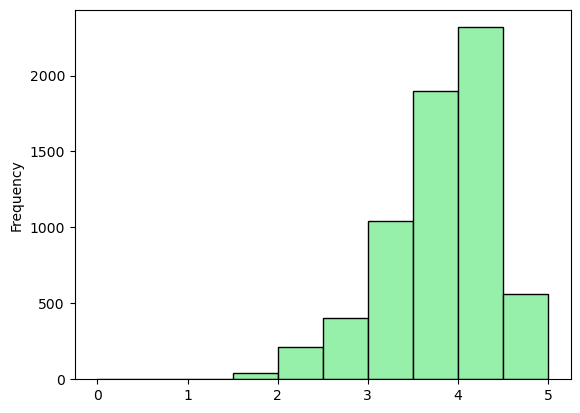

<IPython.core.display.Javascript object>

In [23]:
df_voters['overall_rates'].plot(kind='hist',bins=10,edgecolor='black',color=pal[1])

The overall_rates is visibly left-skewed. We can check whether this is reflected in the discrete star distribution as well.

## `*_star_votes` distribution

[Text(0, 2, '76173'),
 Text(0, 2, '43840'),
 Text(0, 2, '74237'),
 Text(0, 2, '98795'),
 Text(0, 2, '412289')]

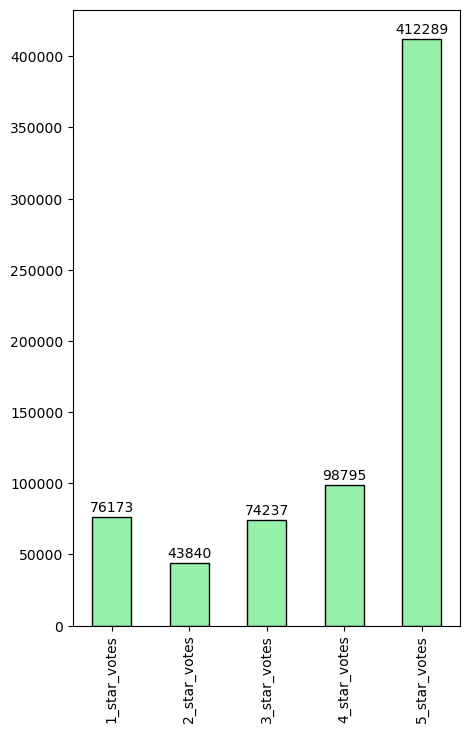

<IPython.core.display.Javascript object>

In [27]:
df_stars = df_voters[['1_star_votes','2_star_votes','3_star_votes','4_star_votes','5_star_votes']].sum()
ax = df_stars.plot(kind='bar',width=0.5,edgecolor='black',figsize=(5,8),color=pal[1])
ax.bar_label(ax.containers[0],padding=2)

Here we can clearly see how there are more 1 star votes than 2 or 3 star votes, which causes the left-skewed distribution on the overall_rates even though most people gave 5 star votes.

# Performance Across Top Genres

## `df_gen_perf`
Make new normalized dataframe to include titles, genres, and performance stats

In [30]:
# select titles, genres, and overall_rates from df_voters
df_gen_perf = df_voters.loc[:,['title','genres','overall_rates','1_star_votes','2_star_votes','3_star_votes','4_star_votes','5_star_votes']]
# normalize lists in genres using explore
df_gen_perf = df_gen_perf.explode('genres').reset_index(drop=True)
df_gen_perf.head()

,title,genres,overall_rates,1_star_votes,2_star_votes,3_star_votes,4_star_votes,5_star_votes
0,MMORPG: The Elementalist,Action,3.2,12,3,11,2,16
1,MMORPG: The Elementalist,Adventure,3.2,12,3,11,2,16
2,MMORPG: The Elementalist,Fantasy,3.2,12,3,11,2,16
3,The True Scandal,Psychological,3.9,4,2,2,2,16
4,The True Scandal,Romance,3.9,4,2,2,2,16


<IPython.core.display.Javascript object>

## Choose top genre

In [40]:
print(df_gen_perf['genres'].nunique())
print(df_gen_perf['genres'].value_counts(ascending=False))

35
Romance          4228
Fantasy          2529
Comedy           2156
Action           2017
Drama            1993
Adventure        1669
Yaoi             1430
Slice of Life    1198
Supernatural     1042
Martial Arts      963
Mature            946
Josei             856
Harem             827
School Life       777
Xuanhuan          765
Shounen Ai        722
Historical        631
Sci-fi            624
Mystery           614
Adult             591
Tragedy           549
Psychological     454
Xianxia           432
Smut              396
Shoujo            306
Horror            295
Gender Bender     159
Yuri              157
Ecchi             122
Mecha             115
Wuxia             111
Seinen            107
Shounen           103
Sports             81
Shoujo Ai          22
Name: genres, dtype: int64


<IPython.core.display.Javascript object>

In [38]:
df_gen_perf['genres'].value_counts(ascending=False).loc[lambda x: x>1000]

Romance          4228
Fantasy          2529
Comedy           2156
Action           2017
Drama            1993
Adventure        1669
Yaoi             1430
Slice of Life    1198
Supernatural     1042
Name: genres, dtype: int64

<IPython.core.display.Javascript object>

Here, we will choose genres with **more than 1000 novels**.<br>
We can plot the value counts for these novels using horizontal bar chart.

Output saved by creating file at genres_count.png.


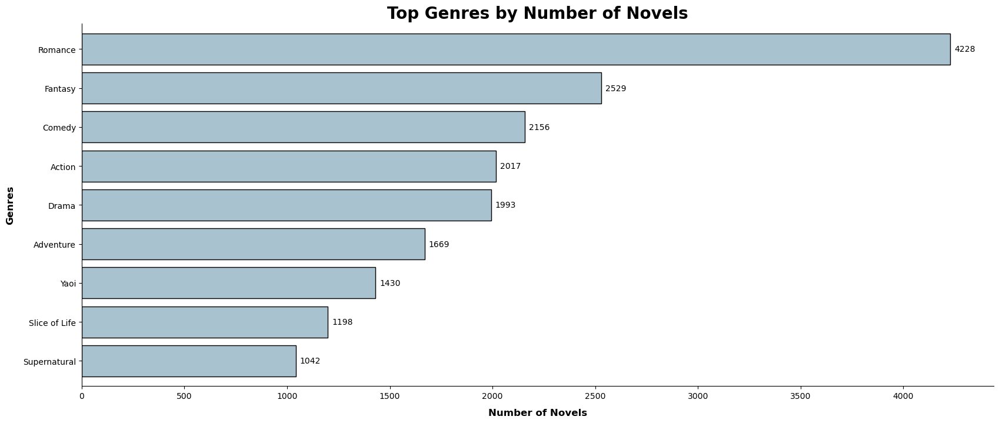

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [31]:
%%capture_img --path "genres_count.png"
top_lst = df_gen_perf['genres'].value_counts().loc[lambda x: x>1000].index.to_list()
df_top_genre = df_gen_perf.loc[lambda x: x['genres'].isin(top_lst)]
ax = df_top_genre['genres'].value_counts(ascending=True).plot(kind='barh',width=0.8,figsize=(20,8),color="#A8C2CF",edgecolor='black')
ax.bar_label(ax.containers[0],padding=5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_title('Top Genres by Number of Novels',fontweight='bold',fontsize=20,pad=20,y=0.97)
ax.set_ylabel('Genres',fontweight='semibold',fontsize=12,labelpad=10)
ax.set_xlabel('Number of Novels',fontweight='semibold',fontsize=12,labelpad=10)
plt.show()

Now we can clearly see how romance is dominating the translated webnovel archive with over 4000 books, way above the second highest fantasy genre with 2529 novels. It's also interesting how **yaoi**, a genre involves (and often focuses on) intimate relationships between men, placed 7th with 1430 novels.

## Statistics of top genre's `overall_rates`

In [50]:
df_temp = df_top_genre.groupby('genres')['overall_rates'].describe()
df_temp.style.background_gradient(cmap='Blues',axis=0)

,count,mean,std,min,25%,50%,75%,max
genres,,,,,,,,
Action,2017.000000,3.666039,0.595104,0.000000,3.300000,3.800000,4.100000,5.000000
Adventure,1669.000000,3.718334,0.557798,0.000000,3.400000,3.800000,4.100000,5.000000
Comedy,2156.000000,3.906725,0.501604,1.600000,3.600000,4.000000,4.300000,5.000000
Drama,1993.000000,3.842097,0.583344,1.300000,3.600000,4.000000,4.300000,5.000000
Fantasy,2529.000000,3.700356,0.608890,0.000000,3.400000,3.800000,4.100000,5.000000
Romance,4228.000000,3.838292,0.573731,0.000000,3.600000,4.000000,4.300000,5.000000
Slice of Life,1198.000000,3.887980,0.560632,1.700000,3.600000,4.000000,4.300000,4.800000
Supernatural,1042.000000,3.833973,0.572368,0.000000,3.500000,3.900000,4.200000,5.000000
Yaoi,1430.000000,4.013147,0.404396,2.000000,3.800000,4.100000,4.300000,5.000000


<IPython.core.display.Javascript object>

From this statistics, we can gather a few information:
* Yaoi has the highest average with lowest standard deviation and considerably high minimum, meaning yaoi readers are mostly very forgiving and tend to give higher rating to the novels they read
* On the other hand, both fantasy and action have very high standard deviation, meaning they have a more spread out distribution. This is understandable as there are a lot of novels in both genres

## Bar graph of `overall_rates` mean for each top genre

<AxesSubplot:xlabel='genres'>

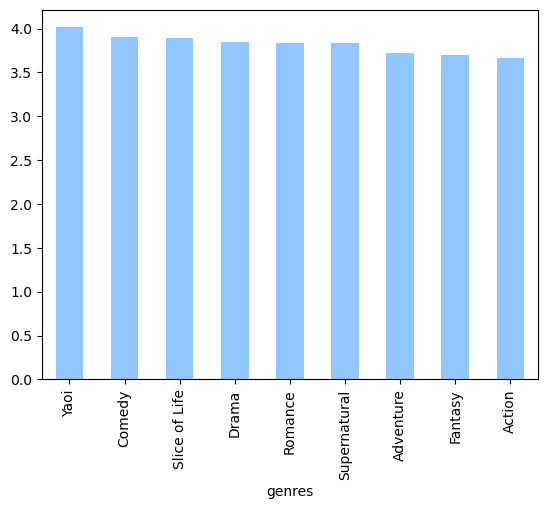

<IPython.core.display.Javascript object>

In [35]:
df_top_genre.groupby('genres')['overall_rates'].mean().sort_values(ascending=False).plot(kind='bar',color=pal[0])

## Bar graph of `overall_rates` standard deviation for each top genre

Text(0.5, 1.0, 'Standard Deviation of Top Genres')

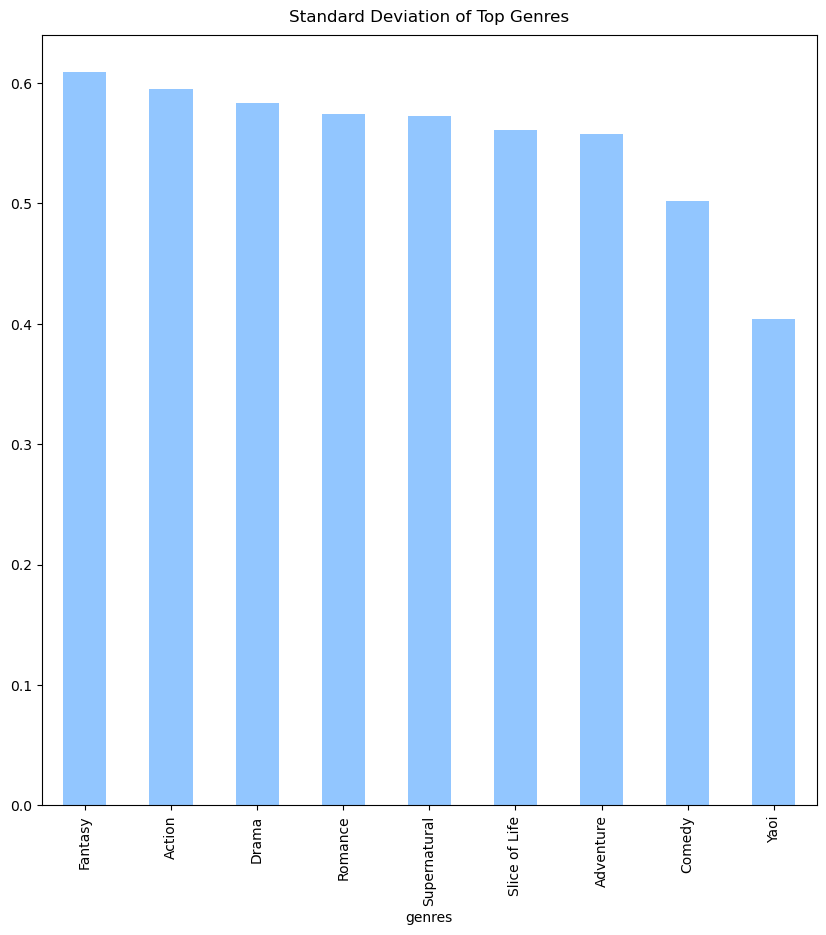

<IPython.core.display.Javascript object>

In [65]:
fig,ax = plt.subplots(figsize=(10,10))
df_top_genre.groupby('genres')['overall_rates'].agg(np.std,ddof=0).sort_values(ascending=False).plot(kind='bar',color=pal[0])
ax.set_title("Standard Deviation of Top Genres",pad=10)

## Visualization of each genre's mean compared to an overall mean lines

In [71]:
df_top_genre.groupby('genres')['overall_rates'].mean().values

array([3.66603867, 3.71833433, 3.90672542, 3.84209734, 3.70035587,
       3.83829234, 3.88797997, 3.83397313, 4.01314685])

<IPython.core.display.Javascript object>

Output saved by creating file at mean_total_vs_genre.png.


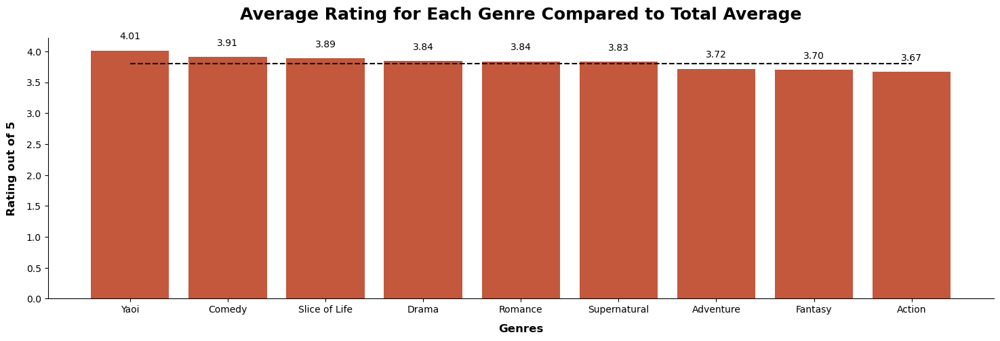

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [33]:
%%capture_img --path "mean_total_vs_genre.png"
x = df_top_genre.groupby('genres')['overall_rates'].mean().sort_values(ascending=False).index
y = df_top_genre.groupby('genres')['overall_rates'].mean().sort_values(ascending=False).values
y_mean = [df_gen_perf['overall_rates'].mean()]*len(x)  # 3.8016340414180183
fig,ax = plt.subplots(figsize=(18,5))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
data_bar = ax.bar(x,y,color="#C3583C")
mean_line = ax.plot(x,y_mean, linestyle='--',color='Black')
ax.bar_label(ax.containers[0],padding=10,fmt='%.2f')
ax.set_title('Average Rating for Each Genre Compared to Total Average',fontweight='bold',fontsize=18,pad=20)
ax.set_xlabel('Genres',fontsize=12,fontweight='semibold',labelpad=10)
ax.set_ylabel('Rating out of 5',fontsize=12,fontweight='semibold',labelpad=10)
plt.show()

## Value distribution
We can see the percentage of each `overall_rates` values for each top genre. The percentage is calculated by counting the rate frequencies and divide it with the total voters (sum of all frequencies) and multiplying it by 100.

### Distribution visualization using `background_gradient()` with `axis=None`
This distribution shows how the rating frequency percentages are concentrated with the heatmap color assignment done in respect to all numbers in the dataframe.

In [53]:
df_temp = df_top_genre.groupby('genres')['overall_rates'].value_counts().unstack()
df_temp = df_temp.div(df_temp.sum(axis=1),axis=0)*100
df_temp.style.background_gradient(cmap='Blues',axis=None).applymap(lambda x: 'color: transparent; background-color: transparent' if pd.isnull(x) else '')

overall_rates,0.000000,1.300000,1.500000,1.600000,1.700000,1.800000,1.900000,2.000000,2.100000,2.200000,2.300000,2.400000,2.500000,2.600000,2.700000,2.800000,2.900000,3.000000,3.100000,3.200000,3.300000,3.400000,3.500000,3.600000,3.700000,3.800000,3.900000,4.000000,4.100000,4.200000,4.300000,4.400000,4.500000,4.600000,4.700000,4.800000,4.900000,5.000000
genres,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Action,0.049579,0.049579,nan,0.049579,0.099157,0.247893,0.148736,0.545364,0.545364,0.297471,1.090729,0.892414,1.140307,1.536936,0.941993,1.784829,2.131879,3.966287,3.123451,3.569658,4.610808,5.057015,5.651958,5.800694,6.445216,7.139316,7.238473,7.387209,7.387209,5.205751,5.552801,3.916708,3.073872,1.784829,1.090729,0.198314,0.049579,0.198314
Adventure,0.059916,0.059916,nan,0.059916,0.059916,0.119832,0.059916,0.179748,0.299581,0.179748,0.958658,0.599161,0.838826,0.838826,0.838826,1.857400,1.737567,3.954464,3.055722,3.295386,4.373877,4.673457,6.111444,5.632115,6.950270,7.609347,7.609347,8.268424,6.830437,5.751947,6.171360,4.613541,3.055722,1.797484,0.958658,0.239664,0.059916,0.239664
Comedy,nan,nan,nan,0.092764,0.092764,0.092764,nan,0.046382,0.139147,0.092764,0.231911,0.417440,0.324675,0.788497,0.602968,1.066790,0.974026,1.994434,1.252319,2.087199,3.107607,3.664193,4.267161,4.545455,5.426716,6.261596,8.116883,8.998145,9.322820,8.812616,9.972171,6.586271,5.194805,3.525046,1.437848,0.324675,0.046382,0.092764
Drama,nan,0.050176,0.100351,0.050176,0.200702,0.200702,0.100351,0.501756,0.301054,0.200702,0.652283,0.652283,0.702459,1.154039,0.903161,1.404917,1.103864,2.207727,1.756147,2.809834,3.060712,3.462117,3.411942,4.315103,5.669844,6.171601,7.476167,9.182137,8.981435,7.476167,7.576518,6.723532,5.418966,3.612644,1.806322,0.301054,0.050176,0.250878
Fantasy,0.118624,nan,0.039541,nan,0.276789,0.118624,0.197707,1.028074,0.553578,0.276789,1.107157,0.751285,0.909450,1.383946,0.909450,1.463029,1.621194,3.677343,2.570186,2.846975,4.310004,4.468169,5.298537,5.535785,7.196520,6.722025,7.196520,7.750099,7.591934,6.326611,6.642942,4.507711,3.044682,2.214314,0.948992,0.197707,0.039541,0.158165
Romance,0.023652,0.023652,0.094607,0.070956,0.212867,0.118259,0.094607,0.425733,0.307474,0.378430,0.567644,0.662252,0.662252,0.922422,0.922422,1.158940,1.182592,2.199622,1.939451,2.743614,3.027436,3.405866,3.618732,5.108798,5.392621,6.646168,7.497635,8.916746,8.609272,7.994324,8.396405,6.078524,5.250710,3.334910,1.537370,0.354778,0.023652,0.094607
Slice of Life,nan,nan,nan,nan,0.166945,0.166945,nan,0.584307,0.417362,0.333890,0.500835,0.417362,0.667780,0.667780,0.667780,1.085142,1.001669,2.337229,1.252087,2.587646,2.754591,3.923205,3.338898,3.923205,5.926544,6.010017,6.510851,8.597663,8.681135,8.430718,9.682805,6.010017,6.260434,4.674457,2.086811,0.333890,nan,nan
Supernatural,0.095969,nan,nan,nan,0.095969,0.095969,0.191939,0.095969,0.479846,0.095969,0.959693,0.959693,0.959693,0.575816,0.863724,1.439539,1.727447,1.247601,1.535509,2.591171,3.358925,4.126679,4.126679,4.894434,5.374280,6.717850,7.677543,8.253359,8.925144,7.581574,8.541267,6.621881,4.318618,3.454894,1.535509,0.383877,nan,0.095969
Yaoi,nan,nan,nan,nan,nan,nan,nan,0.069930,nan,0.069930,0.069930,0.209790,nan,0.279720,0.209790,0.209790,0.419580,0.699301,1.258741,1.608392,1.538462,3.146853,2.657343,4.195804,4.895105,6.643357,10.000000,10.139860,10.839161,9.510490,11.048951,8.671329,6.363636,3.566434,1.468531,0.139860,nan,0.069930


<IPython.core.display.Javascript object>

### Distribution visualization using `background_gradient()` with `axis=0`
This distribution shows how the rating frequency percentages are concentrated with the heatmap color assignment done in respect to the numbers in the columns. Therefore the darker ones in column A is not going to be necessarily higher than the lightest in the column B..

In [54]:
df_temp = df_top_genre.groupby('genres')['overall_rates'].value_counts().unstack()
df_temp = df_temp.div(df_temp.sum(axis=1),axis=0)*100
df_temp.style.background_gradient(cmap='Greens',axis=0).applymap(lambda x: 'color: transparent; background-color: transparent' if pd.isnull(x) else '')

overall_rates,0.000000,1.300000,1.500000,1.600000,1.700000,1.800000,1.900000,2.000000,2.100000,2.200000,2.300000,2.400000,2.500000,2.600000,2.700000,2.800000,2.900000,3.000000,3.100000,3.200000,3.300000,3.400000,3.500000,3.600000,3.700000,3.800000,3.900000,4.000000,4.100000,4.200000,4.300000,4.400000,4.500000,4.600000,4.700000,4.800000,4.900000,5.000000
genres,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Action,0.049579,0.049579,nan,0.049579,0.099157,0.247893,0.148736,0.545364,0.545364,0.297471,1.090729,0.892414,1.140307,1.536936,0.941993,1.784829,2.131879,3.966287,3.123451,3.569658,4.610808,5.057015,5.651958,5.800694,6.445216,7.139316,7.238473,7.387209,7.387209,5.205751,5.552801,3.916708,3.073872,1.784829,1.090729,0.198314,0.049579,0.198314
Adventure,0.059916,0.059916,nan,0.059916,0.059916,0.119832,0.059916,0.179748,0.299581,0.179748,0.958658,0.599161,0.838826,0.838826,0.838826,1.857400,1.737567,3.954464,3.055722,3.295386,4.373877,4.673457,6.111444,5.632115,6.950270,7.609347,7.609347,8.268424,6.830437,5.751947,6.171360,4.613541,3.055722,1.797484,0.958658,0.239664,0.059916,0.239664
Comedy,nan,nan,nan,0.092764,0.092764,0.092764,nan,0.046382,0.139147,0.092764,0.231911,0.417440,0.324675,0.788497,0.602968,1.066790,0.974026,1.994434,1.252319,2.087199,3.107607,3.664193,4.267161,4.545455,5.426716,6.261596,8.116883,8.998145,9.322820,8.812616,9.972171,6.586271,5.194805,3.525046,1.437848,0.324675,0.046382,0.092764
Drama,nan,0.050176,0.100351,0.050176,0.200702,0.200702,0.100351,0.501756,0.301054,0.200702,0.652283,0.652283,0.702459,1.154039,0.903161,1.404917,1.103864,2.207727,1.756147,2.809834,3.060712,3.462117,3.411942,4.315103,5.669844,6.171601,7.476167,9.182137,8.981435,7.476167,7.576518,6.723532,5.418966,3.612644,1.806322,0.301054,0.050176,0.250878
Fantasy,0.118624,nan,0.039541,nan,0.276789,0.118624,0.197707,1.028074,0.553578,0.276789,1.107157,0.751285,0.909450,1.383946,0.909450,1.463029,1.621194,3.677343,2.570186,2.846975,4.310004,4.468169,5.298537,5.535785,7.196520,6.722025,7.196520,7.750099,7.591934,6.326611,6.642942,4.507711,3.044682,2.214314,0.948992,0.197707,0.039541,0.158165
Romance,0.023652,0.023652,0.094607,0.070956,0.212867,0.118259,0.094607,0.425733,0.307474,0.378430,0.567644,0.662252,0.662252,0.922422,0.922422,1.158940,1.182592,2.199622,1.939451,2.743614,3.027436,3.405866,3.618732,5.108798,5.392621,6.646168,7.497635,8.916746,8.609272,7.994324,8.396405,6.078524,5.250710,3.334910,1.537370,0.354778,0.023652,0.094607
Slice of Life,nan,nan,nan,nan,0.166945,0.166945,nan,0.584307,0.417362,0.333890,0.500835,0.417362,0.667780,0.667780,0.667780,1.085142,1.001669,2.337229,1.252087,2.587646,2.754591,3.923205,3.338898,3.923205,5.926544,6.010017,6.510851,8.597663,8.681135,8.430718,9.682805,6.010017,6.260434,4.674457,2.086811,0.333890,nan,nan
Supernatural,0.095969,nan,nan,nan,0.095969,0.095969,0.191939,0.095969,0.479846,0.095969,0.959693,0.959693,0.959693,0.575816,0.863724,1.439539,1.727447,1.247601,1.535509,2.591171,3.358925,4.126679,4.126679,4.894434,5.374280,6.717850,7.677543,8.253359,8.925144,7.581574,8.541267,6.621881,4.318618,3.454894,1.535509,0.383877,nan,0.095969
Yaoi,nan,nan,nan,nan,nan,nan,nan,0.069930,nan,0.069930,0.069930,0.209790,nan,0.279720,0.209790,0.209790,0.419580,0.699301,1.258741,1.608392,1.538462,3.146853,2.657343,4.195804,4.895105,6.643357,10.000000,10.139860,10.839161,9.510490,11.048951,8.671329,6.363636,3.566434,1.468531,0.139860,nan,0.069930


<IPython.core.display.Javascript object>

## Histogram for `overall_rates` in each top genre

array([[<AxesSubplot:title={'center':'Action'}>,
        <AxesSubplot:title={'center':'Adventure'}>,
        <AxesSubplot:title={'center':'Comedy'}>],
       [<AxesSubplot:title={'center':'Drama'}>,
        <AxesSubplot:title={'center':'Fantasy'}>,
        <AxesSubplot:title={'center':'Romance'}>],
       [<AxesSubplot:title={'center':'Slice of Life'}>,
        <AxesSubplot:title={'center':'Supernatural'}>,
        <AxesSubplot:title={'center':'Yaoi'}>]], dtype=object)

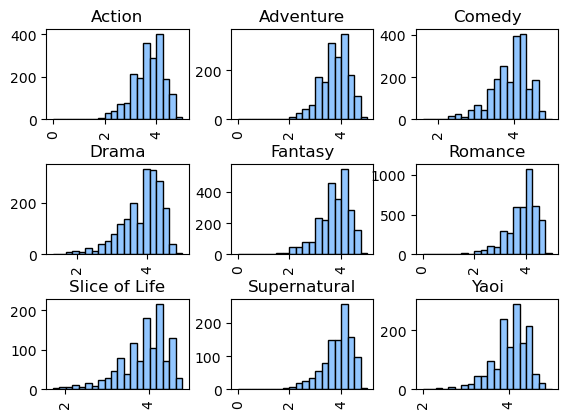

<IPython.core.display.Javascript object>

In [59]:
df_top_genre['overall_rates'].hist(by=df_top_genre['genres'], bins=20,ec='black')

From this histogram, we can see how all of them are quite left skewed, with lighter genres like drama, slice of life, comedy, and yaoi (which, again, mostly just romance that involves men) have shorter range and less spread out. While action and adventure have longer tails.

## Vote Distribution of Top Genres
We are going to find out if the `overall_votes` is representative of the star distributions

Output saved by overwring previous file at top_genre_stars.png.


Text(0.5, 0, 'Genres')

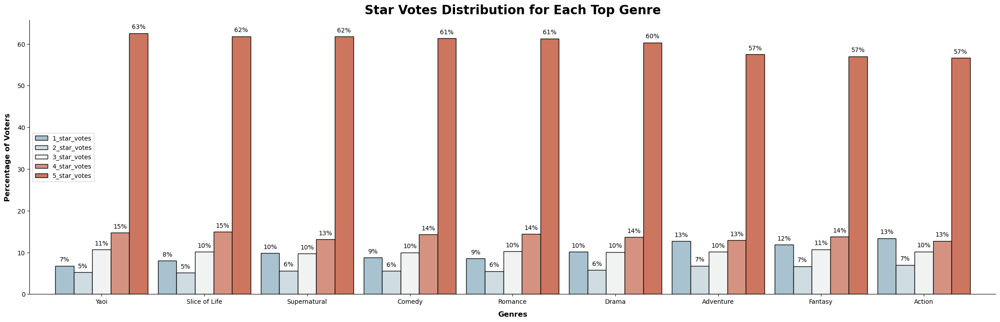

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [37]:
%%capture_img --path "top_genre_stars.png"
df_temp = df_top_genre.groupby('genres')[['1_star_votes','2_star_votes','3_star_votes','4_star_votes','5_star_votes']].sum()
df_temp = df_temp.div(df_temp.sum(axis=1),axis=0)*100
ax = df_temp.sort_values('5_star_votes',ascending=False).plot(kind='bar',figsize=(28,8),width=0.9,rot=0,edgecolor='Black',
                                                             color=["#A8C2CF","#CFDCE2","#F1F2F2","#D59281",'#CC755F'])
ax.legend(loc='center left')
for container in ax.containers:
    ax.bar_label(container,padding=5,fmt='%.f%%')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_title('Star Votes Distribution for Each Top Genre',fontweight='bold',fontsize=20,pad=10)
ax.set_ylabel('Percentage of Voters',fontweight='semibold',labelpad=10,fontsize=12)
ax.set_xlabel('Genres',fontweight='semibold',labelpad=10,fontsize=12)

Most genres actually have the same star votes distribution pattern, where the 1-star votes are significantly higher than the 2-star vote then steadily increasing with high jumps in votes at 5-stars.

That being said, there are some key takeaways:
* Genres which tends to have more serious plots like action and adventure both have very high 1 star votes with the same percentage as their 4 star votes with 13% each.
* Fantasy and supernatural also have high 1-star percentage, respectively 12% and 10%, with only 2-3% difference compared to the 4-star percentage. 

# Brief Look at All Genres Performance

In [63]:
df_brief = df_gen_perf.groupby('genres')['overall_rates'].describe()
df_brief.style.background_gradient(cmap='Blues',axis=0)

,count,mean,std,min,25%,50%,75%,max
genres,,,,,,,,
Action,2017.000000,3.666039,0.595104,0.000000,3.300000,3.800000,4.100000,5.000000
Adult,591.000000,3.729611,0.594198,1.500000,3.400000,3.800000,4.200000,4.700000
Adventure,1669.000000,3.718334,0.557798,0.000000,3.400000,3.800000,4.100000,5.000000
Comedy,2156.000000,3.906725,0.501604,1.600000,3.600000,4.000000,4.300000,5.000000
Drama,1993.000000,3.842097,0.583344,1.300000,3.600000,4.000000,4.300000,5.000000
Ecchi,122.000000,3.514754,0.515010,2.000000,3.200000,3.600000,3.900000,4.400000
Fantasy,2529.000000,3.700356,0.608890,0.000000,3.400000,3.800000,4.100000,5.000000
Gender Bender,159.000000,3.848428,0.499095,2.000000,3.600000,3.900000,4.200000,4.700000
Harem,827.000000,3.513906,0.555568,1.300000,3.200000,3.600000,3.900000,4.900000


<IPython.core.display.Javascript object>

## COUNT
* **Romance is No. 1**, which can include all kinds of relationships whether it's straight, gay, or lesbian.<br>
  -> It also probably has some correlation with other genres such as Josei, Shoujo, Adult, Smut, etc. To confirm this, we have to perform One Hot Encoding technique for each genres and do a Pearson correlation visualization using Seaborn's heatmap.
* Speaking of Romance, it's interesting how many **yaoi - shounen ai** novels there are, while **shoujo ai** is the least common genre with only 22 novels while yuri isn't doing much better.

## MEAN
* Yuri has the highest average overall rating (which is kinda understandable since there are so few of them), followed by shounen ai and yaoi which are both huge so it's interesting how both of them still have quite high average rating.
* After that is wuxia (genre where people can gain superhuman ability through martial arts but can't achieve immortality) which also has very low count, thus it makes sense. 

## STANDARD DEVIATION
* Sports is the highest, while yuri is the lowest
  -> This means sports novels are quite a niche genre but it seems the opinions on it are quite polarizing

## Bar graph of `overall_rates` mean for each genre

<AxesSubplot:xlabel='genres'>

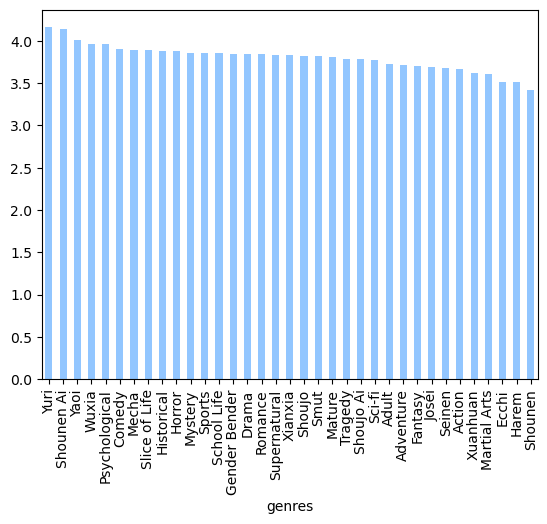

<IPython.core.display.Javascript object>

In [117]:
df_gen_perf.groupby('genres')['overall_rates'].mean().sort_values(ascending=False).plot(kind='bar')

## Relationships Between Each Genres

In [ ]:
df_gen_corr = df.loc[:,['title','genres']]
df_gen_corr.head()

,title,genres
0,MMORPG: The Elementalist,"[Action, Adventure, Fantasy]"
1,The True Scandal,"[Psychological, Romance, Yaoi]"
2,Wholeheartedly Willing,"[Adult, Romance, Smut]"
3,I Can View Character Attributes,"[Action, Martial Arts, Sci-fi, Adventure]"
4,Saving The Black Immortal Venerable,"[Romance, Martial Arts, Comedy, Supernatural, Xianxia]"


<IPython.core.display.Javascript object>

In [ ]:
def explode_encode(df,coltype,col):
    if coltype=='genres':
        kwargs = {col : [1 if col in c else 0 for c in df['genres']]}
    elif coltype=='tags':
        kwargs = {col : [1 if col in c else 0 for c in df['tags']]}
    df = df.assign(**kwargs)
    return df

lst = df_genre['genre'].to_list()
for gen in lst:
    df_gen_corr = explode_encode(df_gen_corr,'genres',gen)
df_gen_corr = df_gen_corr.drop(labels=['genres'],axis='columns')

<IPython.core.display.Javascript object>

In [121]:
corr_mtx = df_gen_corr.corr()
for var in corr_mtx.index.to_list():
    print(corr_mtx.loc[[var]].unstack().sort_values(ascending=False).head(5))
    print(corr_mtx.loc[[var]].unstack().sort_values(ascending=False).tail(5))

Action        Action    1.000000
Adventure     Action    0.559224
Martial Arts  Action    0.443572
Xuanhuan      Action    0.348108
Harem         Action    0.309391
dtype: float64
Josei          Action   -0.152725
Drama          Action   -0.157221
Yaoi           Action   -0.178922
Slice of Life  Action   -0.201318
Romance        Action   -0.401898
dtype: float64
Adult          Adult    1.000000
Smut           Adult    0.505514
Mature         Adult    0.345777
Yaoi           Adult    0.183121
Psychological  Adult    0.091619
dtype: float64
Shoujo      Adult   -0.070456
Action      Adult   -0.083087
Shounen Ai  Adult   -0.084808
Comedy      Adult   -0.089224
Adventure   Adult   -0.089560
dtype: float64
Adventure     Adventure    1.000000
Action        Adventure    0.559224
Martial Arts  Adventure    0.328509
Xuanhuan      Adventure    0.286642
Fantasy       Adventure    0.262654
dtype: float64
Josei          Adventure   -0.131573
Drama          Adventure   -0.135186
Slice of Life  Advent

<IPython.core.display.Javascript object>

<AxesSubplot:>

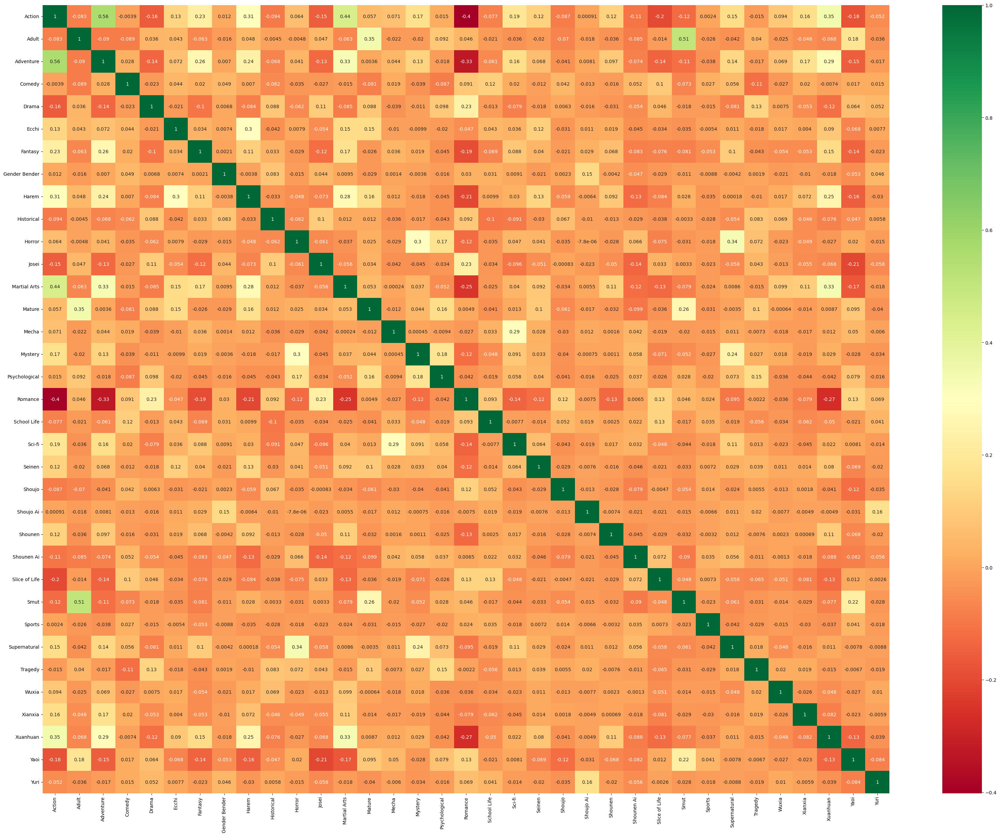

<IPython.core.display.Javascript object>

In [68]:
figure, ax = plt.subplots(figsize=(40,30))
sns.heatmap(corr_mtx,annot=True,cmap='RdYlGn')

## Some notable correlations

### Romance with other genres
As we have seen before, romance has a very high novel count with 4k+ books out of 6k+ in this dataset. We have a suspicion this genre will have quite high correlations with other genres.

Output saved by overwring previous file at romance_others_correlation.png.


Text(0.5, 1.0, 'Correlation Between Romance\nand Other Genres')

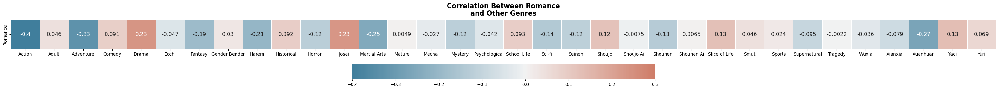

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [28]:
%%capture_img --path "romance_others_correlation.png"
col_Romance = ['Romance']
col_Not_Romance = ['Action', 'Adult', 'Adventure', 'Comedy', 'Drama',
       'Ecchi', 'Fantasy', 'Gender Bender', 'Harem', 'Historical', 'Horror',
       'Josei', 'Martial Arts', 'Mature', 'Mecha', 'Mystery', 'Psychological',
       'School Life', 'Sci-fi', 'Seinen', 'Shoujo', 'Shoujo Ai',
       'Shounen', 'Shounen Ai', 'Slice of Life', 'Smut', 'Sports',
       'Supernatural', 'Tragedy', 'Wuxia', 'Xianxia', 'Xuanhuan', 'Yaoi',
       'Yuri']
corr_mtx = df_gen_corr[col_Romance+col_Not_Romance].corr()
fig,ax = plt.subplots(figsize=(40,2))
plt.subplots_adjust(top=1.7)
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr_mtx.loc[col_Romance,col_Not_Romance],cmap=cmap,annot=True,vmax=.3,center=0,
           square=True,linewidth=.5,cbar_kws={"shrink":.4,"orientation":'horizontal'},annot_kws={"fontsize":12})
ax.set_title('Correlation Between Romance\nand Other Genres',fontsize=15,fontweight='semibold',pad=10)

We can see some how action, adventure, martial arts, and xuanhuan, all of which are targeted towards male audience, have quite low correlation with romance. However, drama and josei (which targets women around 18-30 with realistic romance and less idealized story) have very high correlation. Here we can see how most genres have positive correlation with romance which explains why the book count is so high for this particular genre.

### Correlation between NSFW genres and genres geared towards men

Output saved by overwring previous file at nsfw_men_correlation.png.


Text(0.5, 1.0, 'Correlation Between NSFW Genres\nand Genres Targeted Towards Men')

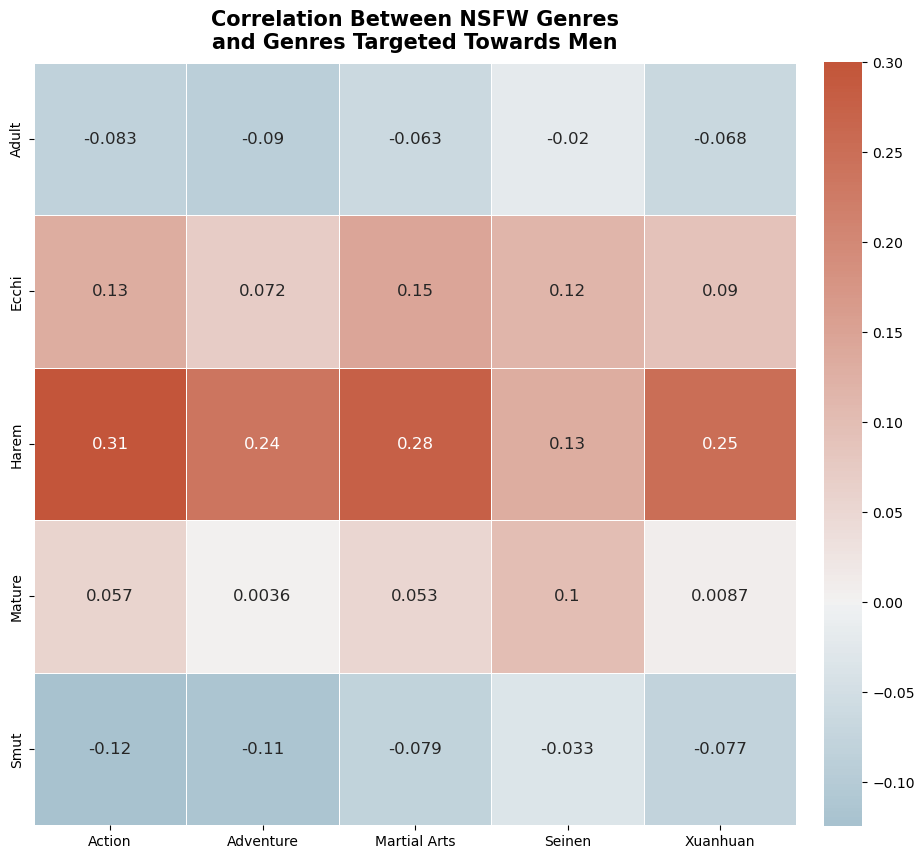

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [224]:
%%capture_img --path "nsfw_men_correlation.png"
col_NSFW = ['Adult','Ecchi','Harem','Mature','Smut']
col_Men = ['Action','Adventure','Martial Arts','Seinen','Xuanhuan']
corr_mtx = df_gen_corr[col_NSFW+col_Men].corr()

# Generate a custom diverging colormap
fig,ax = plt.subplots(figsize=(12,12))
plt.subplots_adjust(top=1.7)
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr_mtx.loc[col_NSFW,col_Men],annot=True,cmap=cmap,vmax=.3,center=0,
           square=True,linewidth=.5,cbar_kws={"shrink":.4,"pad":0.03},annot_kws={"fontsize":12})
ax.set_title('Correlation Between NSFW Genres\nand Genres Targeted Towards Men',fontsize=15,fontweight='semibold',pad=10)

These list (NSFW and men as target audience) are categorized based on NovelUpdate's official genre explanation guide [here](https://www.novelupdates.com/genre-explanation/).

Here, we can see how the harem (involving relationships between 1 man and many women) strongly correlate with every genres which target male audience. Ecchi (borderline hentai) and mature (involving heavy themes like sex, violence, and gore) also show positive correlation albeit not very strong. It's interesting to note how both of these genres have negative correlation with romance, which can be attributed to the 'stallion' stereotype that is very popular within Chinese webnovel sphere. In these genres, men are portrayed as the main protagonists strive to be in power, gain riches, and 'conquer' women.

On the other hand, we can see how both adult and smuts correlate negatively. The negative correlation with adult genre is not too high and, in fact, quite close to 0. This is mostly because adult is a broader genre and mostly used to refer to works with very graphic, prolonged violence and sex scenes.<br>
Smut, as per NovelUpdate's guide, is an genre that focuses on sexual, romantic, and generally intimate relationships between people targeted mostly towards women, so its quite strong negative correlation with 'manly genres' is understandable.

### LGBT-related genres and typically straight romantic genres **vs** other genres

Output saved by overwring previous file at sexuality_others_correlation.png.


Text(0.5, 1.0, 'Correlation Between Sexuality-Related Genres\nand Other Genres')

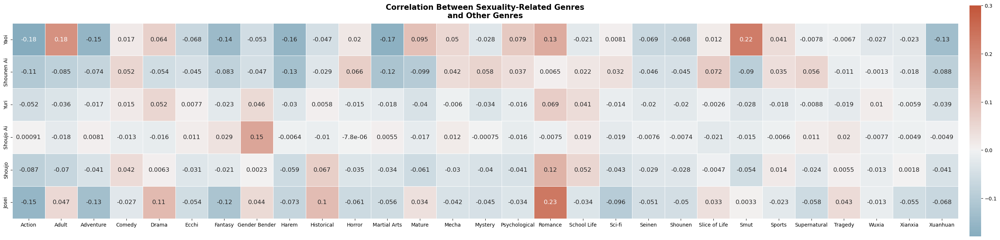

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [221]:
%%capture_img --path "sexuality_others_correlation.png"
col_Sexuality = ['Yaoi','Shounen Ai','Yuri','Shoujo Ai','Shoujo','Josei']
col_Others = ['Action', 'Adult', 'Adventure', 'Comedy', 'Drama',
       'Ecchi', 'Fantasy', 'Gender Bender', 'Harem', 'Historical', 'Horror',
       'Martial Arts', 'Mature', 'Mecha', 'Mystery', 'Psychological',
       'Romance', 'School Life', 'Sci-fi', 'Seinen',
       'Shounen', 'Slice of Life', 'Smut', 'Sports',
       'Supernatural', 'Tragedy', 'Wuxia', 'Xianxia', 'Xuanhuan']
corr_mtx = df_gen_corr[col_Sexuality+col_Others].corr()
fig,ax = plt.subplots(figsize=(40,10))
plt.subplots_adjust(top=1.7)
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr_mtx.loc[col_Sexuality,col_Others],cmap=cmap,annot=True,vmax=.3,center=0,
           square=True,linewidth=.5,cbar_kws={"shrink":.4,"pad":0.01},annot_kws={"fontsize":12})
ax.set_title('Correlation Between Sexuality-Related Genres\nand Other Genres',fontsize=15,fontweight='semibold',pad=10)

* Yaoi has positive correlation with both adult and smut, while shounen ai the opposite. This makes the distinction between the two genres which both involves gay relationships quite clear, where yaoi involves intimate scenes or even sex while shounen ai novels sometimes only glaze over the relationships.
* Josei and shoujo have high correlation with romance and drama, which is understandable.
* Interestingly, shoujo ai has quite high correlation with gender bender, a genre which involves men dressing up as woman and woman dressing up as a man. Quite interesting, especially thinking back as to why? Is it because of certain stereotypes, forcing gender roles on a non-straight relationships? It's also interesting how tragedy placed within top 5 genres with highest correlation with shoujo ai.
  -> Other than that, yuri and shoujo ai both doesn't seem to have particularly strong correlation with other genres. Most likely because there aren't many of these novels translated as well.

## Relationships Between Each Genres and Performance

In [230]:
df_perf_corr = df_voters.copy().drop(labels=['title','description','tags','rec_list','total_voters'],axis='columns')
lst = df_genre['genre'].to_list()
for gen in lst:
    df_perf_corr = explode_encode(df_perf_corr,'genres',gen)
df_perf_corr = df_perf_corr.drop(labels=['genres'],axis='columns')

<IPython.core.display.Javascript object>

Output saved by overwring previous file at genre_performance_correlation.png.


Text(0.5, 1.0, 'Correlation Between Genres and Performance Measures')

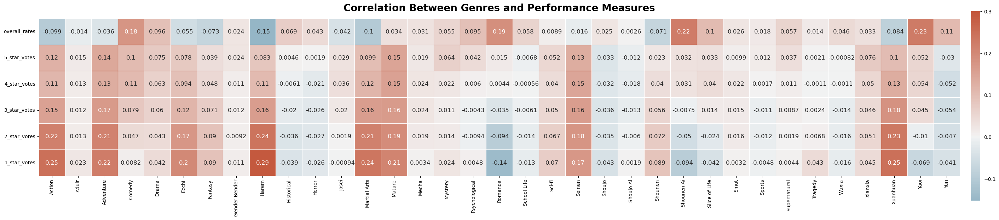

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [257]:
%%capture_img --path "genre_performance_correlation.png"
col_Perf = ['overall_rates', '5_star_votes', '4_star_votes', '3_star_votes', '2_star_votes', '1_star_votes']
col_Genres = df_genre['genre'].to_list()
corr_mtx = df_perf_corr[col_Perf+col_Genres].corr()
fig,ax = plt.subplots(figsize=(40,10))
plt.subplots_adjust(top=1.9)
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr_mtx.loc[col_Perf,col_Genres],cmap=cmap,annot=True,vmax=.3,center=0,
           square=True,linewidth=.5,cbar_kws={"shrink":.3,"pad":0.01,"anchor":(0,0.48)},annot_kws={"fontsize":12})
ax.set_title('Correlation Between Genres and Performance Measures',fontsize=20,fontweight='semibold',pad=15)

Some interesting discoveries:
* Yaoi and Shounen Ai are the top 2 genres with high correlation with `overall_rates`. These genres also shows negative correlation with low star ratings. Romance and comedy also correlate quite strongly with `overall_rates`
* Action, Adventure, Ecchi, Harem, Martial Arts, Seinen, and Xuanhuan show positive correlation from 1-5 stars (lower stars higher correlation), but have negative `overall_rates`. This means the voters are more divided and this causes the average to be lower

# Brief Look at Top Tags

## `df_tags_perf`

In [49]:
# select titles, genres, and overall_rates from df_voters
df_tags_perf = df_voters.loc[:,['title','tags','overall_rates','1_star_votes','2_star_votes','3_star_votes','4_star_votes','5_star_votes']]
# normalize lists in genres using explore
df_tags_perf = df_tags_perf.explode('tags').reset_index(drop=True)
df_tags_perf.head()

,title,tags,overall_rates,1_star_votes,2_star_votes,3_star_votes,4_star_votes,5_star_votes
0,MMORPG: The Elementalist,Elemental Magic,3.2,12,3,11,2,16
1,MMORPG: The Elementalist,Gamers,3.2,12,3,11,2,16
2,MMORPG: The Elementalist,Male Protagonist,3.2,12,3,11,2,16
3,MMORPG: The Elementalist,MMORPG,3.2,12,3,11,2,16
4,MMORPG: The Elementalist,Modern Day,3.2,12,3,11,2,16


<IPython.core.display.Javascript object>

## Choose top tags

In [18]:
print(df_tags_perf['tags'].nunique())
print(df_tags_perf['tags'].value_counts(ascending=False))

791
Handsome Male Lead                                              2817
Modern Day                                                      2366
Female Protagonist                                              2325
Transmigration                                                  1825
Beautiful Female Lead                                           1794
Male Protagonist                                                1704
Love Interest Falls in Love First                               1686
Devoted Love Interests                                          1139
Calm Protagonist                                                1136
Strong Love Interests                                           1081
Doting Love Interests                                           1070
Cultivation                                                     1019
Wealthy Characters                                              1019
Clever Protagonist                                              1003
Weak to Strong                

<IPython.core.display.Javascript object>

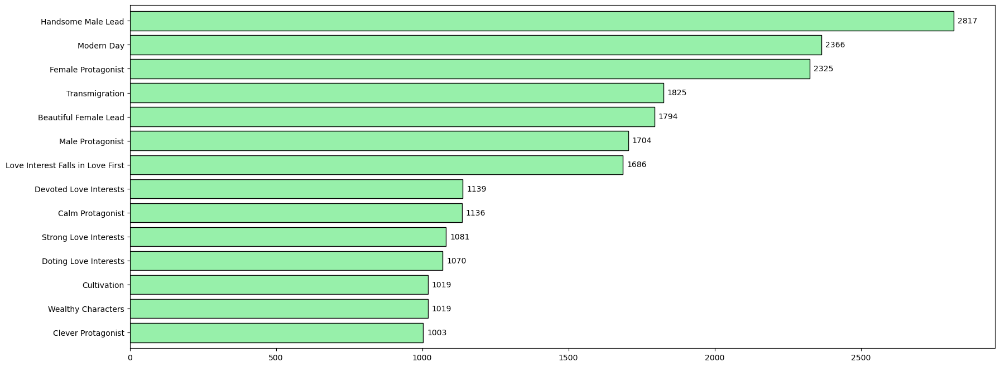

<IPython.core.display.Javascript object>

In [50]:
top_lst = df_tags_perf['tags'].value_counts().loc[lambda x: x>1000].index.to_list()
df_top_tags = df_tags_perf.loc[lambda x: x['tags'].isin(top_lst)]
ax = df_top_tags['tags'].value_counts(ascending=True).plot(kind='barh',width=0.8,figsize=(20,8),color=pal[1],edgecolor='black')
ax.bar_label(ax.containers[0],padding=5)
plt.show()

## Tags' means vs All mean of `overall_rates`

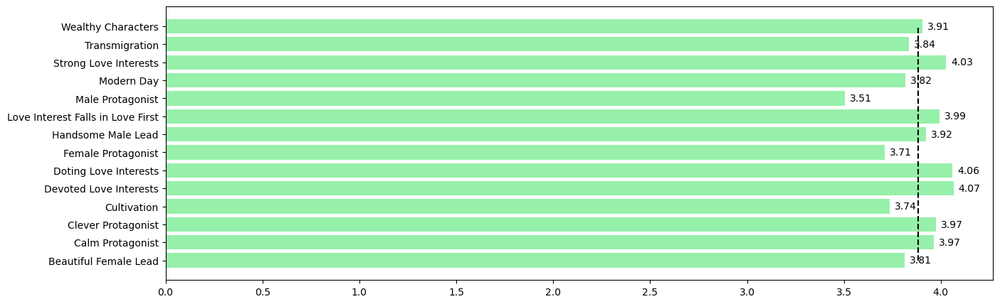

<IPython.core.display.Javascript object>

In [29]:
y = df_top_tags.groupby('tags')['overall_rates'].mean().index
x = df_top_tags.groupby('tags')['overall_rates'].mean().values
x_mean = [df_tags_perf['overall_rates'].mean()]*len(y)
fig,ax = plt.subplots(figsize=(15,5))
data_bar = ax.barh(y,x, color=pal[1])
mean_line = ax.plot(x_mean,y, linestyle='--',color='Black')
ax.bar_label(ax.containers[0],fmt='%.2f',padding=5)
plt.show()

## Top Tags for Romance

Output saved by creating file at top_tags_romance.png.


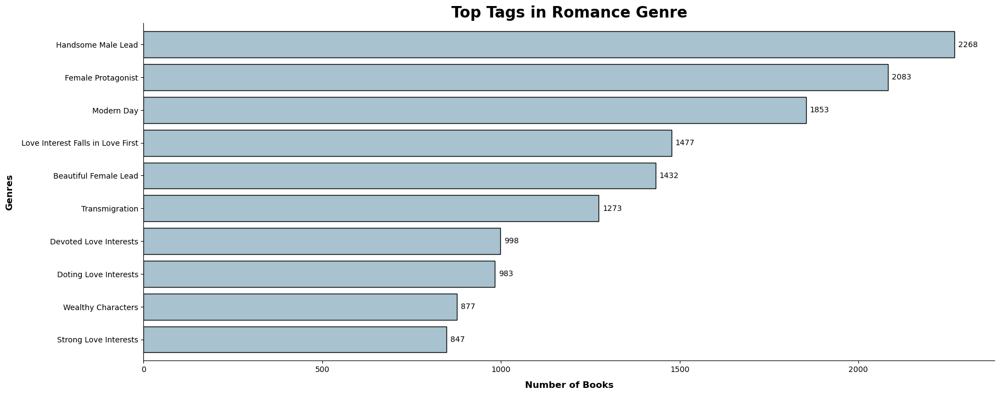

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [32]:
%%capture_img --path "top_tags_romance.png"
df_rom_tags_perf = df_voters[df_voters['genres'].apply(lambda x: set(['Romance'])<=set(x))]
df_rom_tags_perf = df_rom_tags_perf.loc[:,['title','tags','overall_rates',
       '5_star_votes', '4_star_votes', '3_star_votes', '2_star_votes',
       '1_star_votes']]
df_rom_tags_perf = df_rom_tags_perf.explode('tags').reset_index(drop=True)
top_lst = df_rom_tags_perf['tags'].value_counts(ascending=True).tail(10).index.to_list()
df_top_rom_tags =  df_rom_tags_perf[df_rom_tags_perf['tags'].isin(top_lst)]
ax = df_top_rom_tags['tags'].value_counts(ascending=True).plot(kind='barh',width=0.8,figsize=(20,8),color="#A8C2CF",edgecolor='black')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.bar_label(ax.containers[0],padding=5)
ax.set_title('Top Tags in Romance Genre',fontweight='bold',fontsize=20,y=0.97,pad=21)
ax.set_ylabel('Genres',fontweight='semibold',fontsize=12,labelpad=10)
ax.set_xlabel('Number of Books',fontweight='semibold',fontsize=12,labelpad=10)
plt.show()

## Star Top Tags for Romance

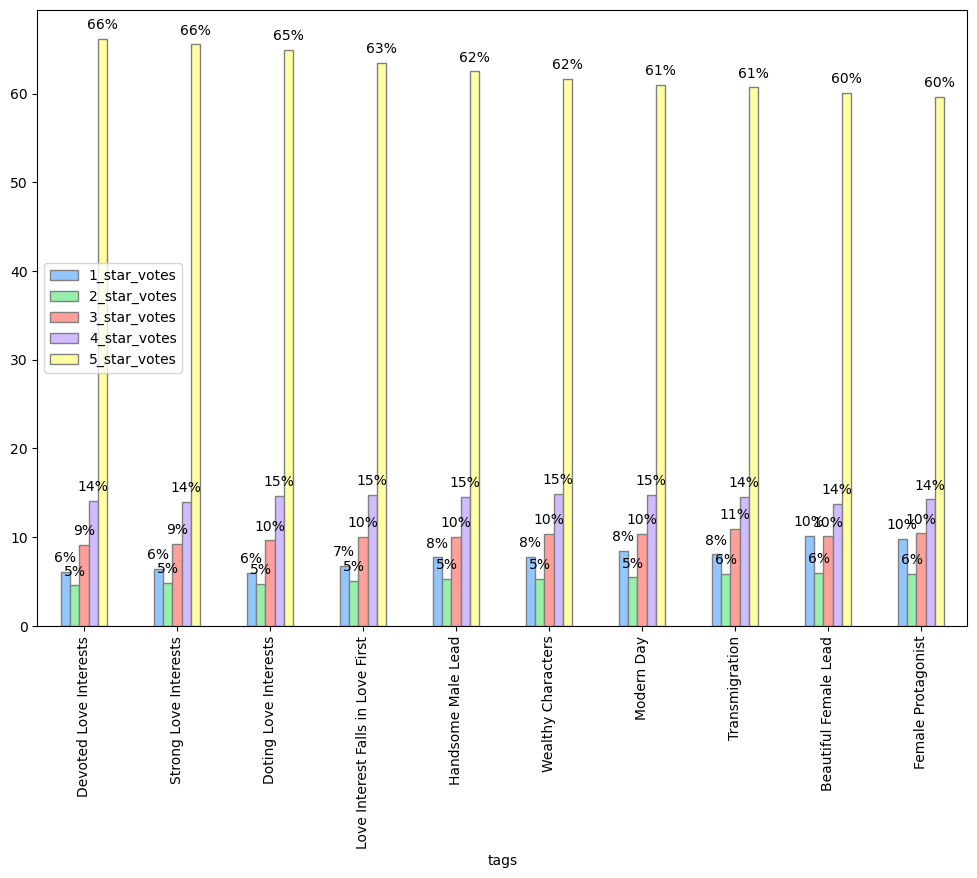

<IPython.core.display.Javascript object>

In [31]:
df_temp = df_top_rom_tags.groupby('tags')[['1_star_votes','2_star_votes','3_star_votes','4_star_votes','5_star_votes']].sum()
df_temp = df_temp.div(df_temp.sum(axis=1),axis=0)*100
ax = df_temp.sort_values('5_star_votes',ascending=False).plot(kind='bar',ec='grey',figsize=(12,8))
ax.legend(loc='center left')
for container in ax.containers:
    ax.bar_label(container,padding=5,fmt='%.f%%')

## Top Tags Correlation With Each Other

In [61]:
for i in df_top_tags['tags'].unique():
    print(i)

Male Protagonist
Modern Day
Wealthy Characters
Female Protagonist
Transmigration
Beautiful Female Lead
Calm Protagonist
Cultivation
Devoted Love Interests
Handsome Male Lead
Love Interest Falls in Love First
Strong Love Interests
Clever Protagonist
Doting Love Interests


<IPython.core.display.Javascript object>

In [70]:
df_tags_corr = df_voters.loc[:,['title','tags']]
lst = df_top_tags['tags'].unique()
for tag in lst:
    df_tags_corr = explode_encode(df_tags_corr,'tags',tag)
df_tags_corr.head(2)

,title,tags,Male Protagonist,Modern Day,Wealthy Characters,Female Protagonist,Transmigration,Beautiful Female Lead,Calm Protagonist,Cultivation,Devoted Love Interests,Handsome Male Lead,Love Interest Falls in Love First,Strong Love Interests,Clever Protagonist,Doting Love Interests
0,MMORPG: The Elementalist,"[Elemental Magic, Gamers, Male Protagonist, MMORPG, Modern Day, Underestimated Protagonist]",1,1,0,0,0,0,0,0,0,0,0,0,0,0
1,The True Scandal,"[Adapted to Drama CD, Adapted to Manhua, Boss-Subordinate Relationship, Businessmen, Child Abuse, Contracts, Misunderstandings, Modern Day, Mysterious Past, Past Trauma, Wealthy Characters]",0,1,1,0,0,0,0,0,0,0,0,0,0,0


<IPython.core.display.Javascript object>

In [131]:
[x.replace(' ','\n') for x in corr_mtx.columns]

['Male\nProtagonist',
 'Modern\nDay',
 'Wealthy\nCharacters',
 'Female\nProtagonist',
 'Transmigration',
 'Beautiful\nFemale\nLead',
 'Calm\nProtagonist',
 'Cultivation',
 'Devoted\nLove\nInterests',
 'Handsome\nMale\nLead',
 'Love\nInterest\nFalls\nin\nLove\nFirst',
 'Strong\nLove\nInterests',
 'Clever\nProtagonist',
 'Doting\nLove\nInterests']

<IPython.core.display.Javascript object>

Output saved by creating file at top_tags_corr.png.


Text(0.5, 0.98, 'Correlation Between Each Top Tag')

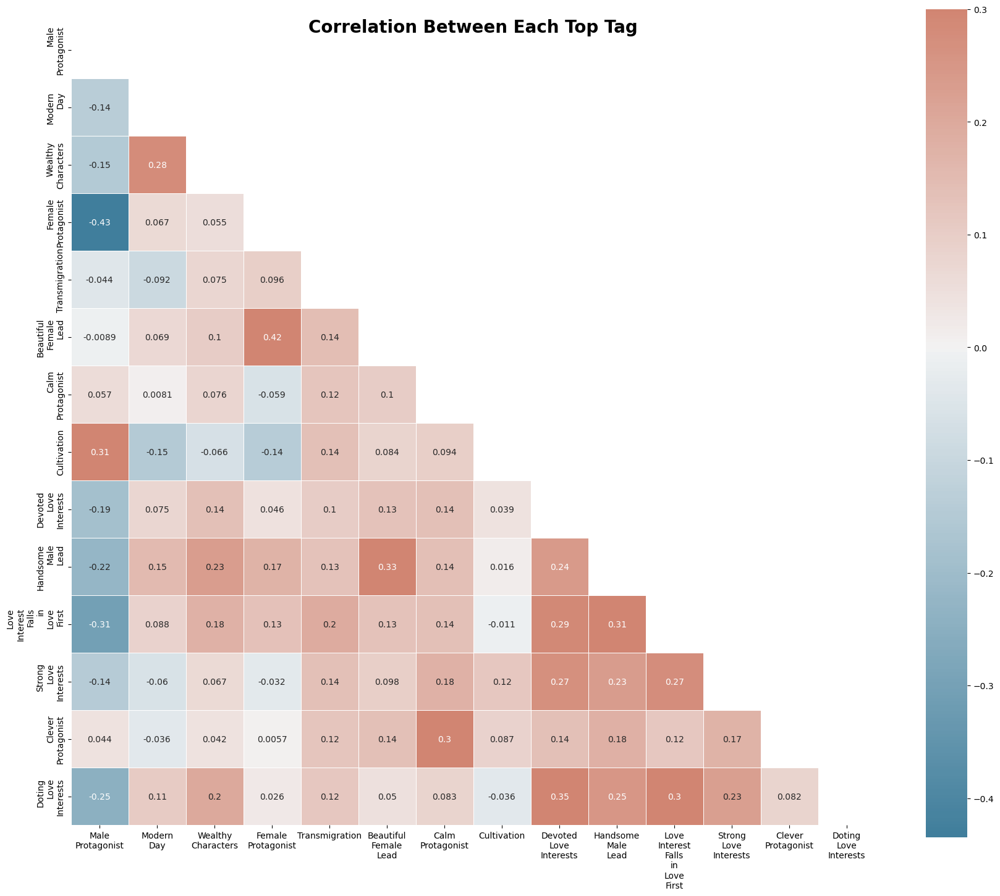

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [161]:
%%capture_img --path "top_tags_corr.png"
corr_mtx = df_tags_corr.corr()
mask = np.triu(corr_mtx)

x_ticks = [x.replace(' ','\n') for x in corr_mtx.columns]
y_ticks = [x.replace(' ','\n') for x in corr_mtx.columns]

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(21, 18))
plt.subplots_adjust(top=1.6)

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_mtx, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5},
            xticklabels=x_ticks,yticklabels=y_ticks,annot=True)
ax.set_title('Correlation Between Each Top Tag',fontsize=20,fontweight='bold',y=0.98)

# Description World Cloud

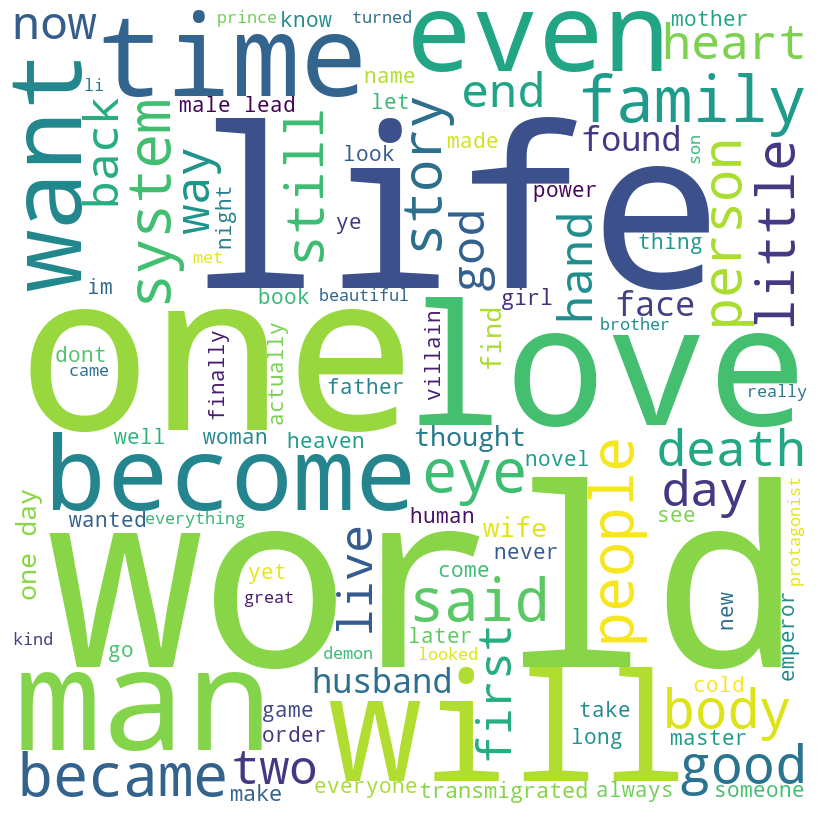

<IPython.core.display.Javascript object>

In [31]:
# final aggregated/concatenated string
comment_words = ''
# stop words to remove
stopwords = set(STOPWORDS)
pattern = re.compile('[^a-zA-Z\d\s-]+')
 
# iterate through the data
for val in df.description:
    # print("ORIGINAL:")
    # print(val)
    val = pattern.sub('',val)
    # print("EDIT:")
    # print(val)
    # print('---'*15)
    # split the value
    tokens = val.split()
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    comment_words += " ".join(tokens)+" "

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10,
                max_words=100,collocations=True).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

# Title Word Cloud

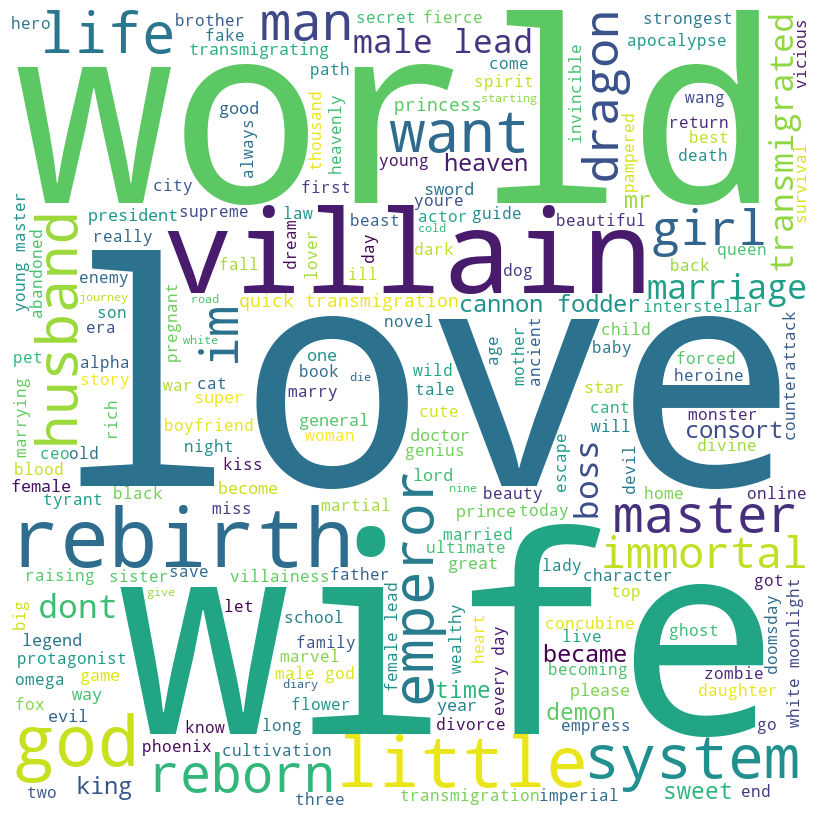

<IPython.core.display.Javascript object>

In [36]:
# final aggregated/concatenated string
comment_words = ''
# stop words to remove
stopwords = set(STOPWORDS)
pattern = re.compile('[^a-zA-Z\d\s-]+')
 
# iterate through the data
for val in df.title:
    # print("ORIGINAL:")
    # print(val)
    val = pattern.sub('',val)
    # print("EDIT:")
    # print(val)
    # print('---'*15)
    # split the value
    tokens = val.split()
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    comment_words += " ".join(tokens)+" "

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10,
                max_words=200,collocations=True).generate(comment_words)
 
# plot the WordCloud image                      
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

## Mask

Output saved by overwring previous file at title_wordcloud.png.


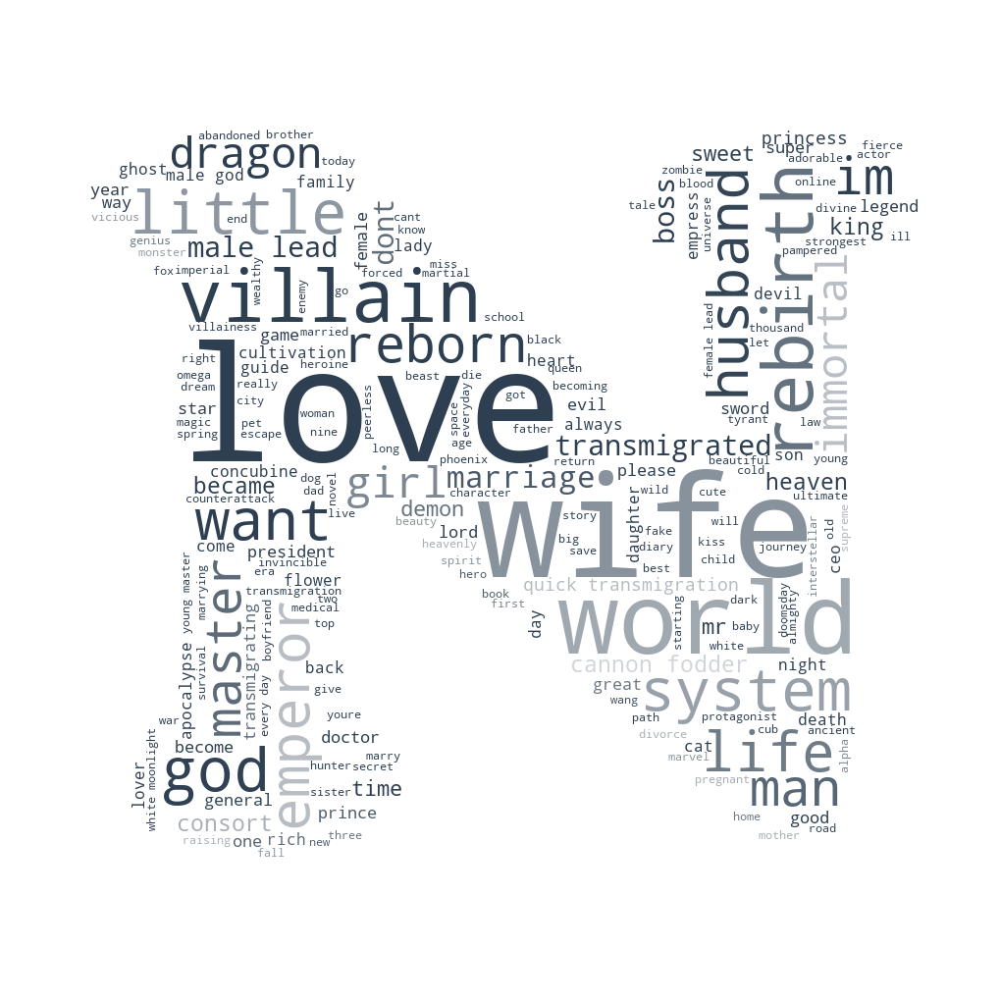

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [48]:
%%capture_img --path "title_wordcloud.png"
# add picture mask
logo_mask = np.array(Image.open("idU9YIU00r.png"))

# final aggregated/concatenated string
comment_words = ''
# stop words to remove
stopwords = set(STOPWORDS)
pattern = re.compile('[^a-zA-Z\d\s-]+')
 
# iterate through the data
for val in df.title:
    # print("ORIGINAL:")
    # print(val)
    val = pattern.sub('',val)
    # print("EDIT:")
    # print(val)
    # print('---'*15)
    # split the value
    tokens = val.split()
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
    comment_words += " ".join(tokens)+" "

wordcloud = WordCloud(mask=logo_mask,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10,
                max_words=1000,collocations=True).generate(comment_words)
 
# plot the WordCloud image        
image_colors = ImageColorGenerator(logo_mask)
plt.figure(figsize = (10, 10), facecolor = None)
plt.imshow(wordcloud.recolor(color_func=image_colors),interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

# Main Answers
1. Romance is the most translated genre on the site, reflected by 'handsome male lead' as the most used tag. However, the most popular novel with the highest total voters is a stallion novel called Against The God
2. Romance placed 5th in average rating and has 5th highest 5-star voters amongst other top genres. The first positions in both categories are occupied by yaoi, a genre with gay main characters. Meanwhile, 'Devoted Love Interest' is the tag with highest average rating
3. Romance is a genre made up of light-read books which has high correlation to other light-read genres like slice of life or drama. There are also interesting connection between NSFW Genres and Genres Targeted Towards Men, Sexuality Related Genre and Others, and Genres and Performance. 

# Future Recommendations
Is there any visible pattern for rec_list? Is it possible to build a graph on how they're all related? Can we see clusters of novels or genres?
(Tried using NetworkX to get the graph and visualize it both using plotly and PyVis but didn't work out very well)